In [1]:
%load_ext autoreload
import os,sys
import pandas as pd
import seaborn as sns
from matplotlib import cm
import ms_peak_picker
import scipy
import numpy as np
import progressbar
import dill as pickle
from datetime import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
import logging
from adjustText import adjust_text
import random

import math
from scipy.signal import argrelextrema
from collections import defaultdict

sys.path = ["/usr/local/hdd2/data/plaque_ims/pimz/"] + sys.path

print(sys.path)

%autoreload 2
from pIMZ.regions import *
%autoreload 2
from pIMZ.imzml import *
%autoreload 2
from pIMZ.comparative import *
%autoreload 2
from pIMZ.clustering import *
%autoreload 2
from pIMZ.annotations import *
%autoreload 2
from pIMZ.differential import *


import pIMZ

['/usr/local/hdd2/data/plaque_ims/pimz/', '/usr/local/hdd2/data/plaque_ims', '/usr/local/hdd2/data/plaque_ims', '/usr/local/hdd/tfunet/models/research/slim', '/usr/local/hdd/tfunet/models/research', '/usr/lib/python38.zip', '/usr/lib/python3.8', '/usr/lib/python3.8/lib-dynload', '', '/home/markus/.local/lib/python3.8/site-packages', '/usr/local/lib/python3.8/dist-packages', '/usr/lib/python3/dist-packages']


In [2]:
! ls

211102_ATL1_Aorta_Lipids.ibd
211102_ATL1_Aorta_Lipids.imzML
211102_ATL1_Aorta_Lipids.imzML.regions
211103_ATPe1_Peptides.ibd
211103_ATPe1_Peptides.imzML
211103_ATPe1_Peptides.imzML.regions
PXD003930_peptides.tsv
PXD006752_whole_peptides.tsv
Rita_Peptides.ipynb
cluster_markers_peptides.tsv
cluster_markers_unique_peptides.tsv
found_markers_aorta_peptides.tsv
found_markers_backwards_aorta_peptides.tsv
lipids_1_spectra.svg
lipids_1_spectra_with_peaks.svg
lipids_region0_kmeans.png
lipids_region0_shrunkencentroids.png
lipids_region1_kmeans.png
lipids_region1_kmeans.svg
lipids_region1_pca.svg
lipids_region1_shrunkencentroids.svg
lipids_region_1_ppp.png
lipids_region_3_ppp.png
lipidsslide.ipynb
output.png
peptide_masses.npy
peptide_slide.pickle
peptide_spec_16000.pickle
peptides5ppm.tsv
peptides_matrix.npy
peptideslide.ipynb
test.pdf
test.tsv


In [3]:
imze = IMZMLExtract("211103_ATPe1_Peptides.imzML")

Opening regions file for 211103_ATPe1_Peptides.imzML
1 530 718 321 522
2 996 1028 595 619
3 1249 1316 383 440
4 1761 1956 326 532


Checked 1000 spectra. All have same m/z Values.            |   1% ETA:  0:02:13
All have same m/z Values.


1 ((530, 718, 321, 522), 27077)
2 ((996, 1028, 595, 619), 825)
3 ((1249, 1316, 383, 440), 2931)
4 ((1761, 1956, 326, 532), 28440)


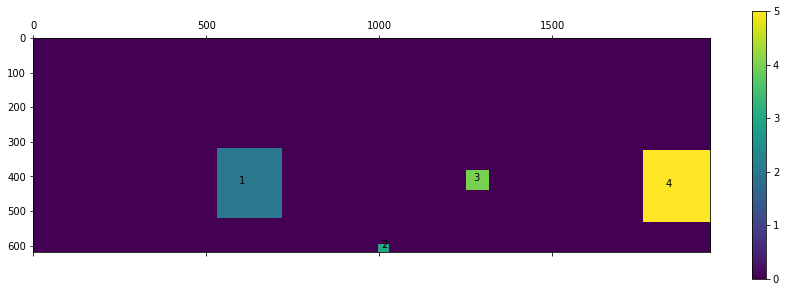

In [4]:
_ = imze.list_regions()

In [5]:
#spectra1_orig, spectra1_masses = imze.get_region_array_for_continuous_region(1, resolution=0.05)

In [6]:
spectra1_orig, spectra1_masses = imze.get_region_array(1)

spectra1_baseline = imze.normalize_region_array(spectra1_orig, normalize="baselines_pybaseline")

Fetching region range
|##########################################################| 100% Time: 0:00:00
Fetching region shape
|##########################################################| 100% Time: 0:00:00
Found region 1 with shape (189, 202, 58400)
Fetching region spectra
|##########################################################| 100% Time: 0:01:26
|##########################################################| 100% Time: 0:00:04
Finished region 1 with shape (189, 202, 58400) (0 padded pixels)
|##########################################################| 100% Time: 0:00:51


In [7]:
#spectra4_orig, spectra4_masses = imze.get_region_array_for_continuous_region(4, new_masses=spectra1_masses)

In [8]:
plt.rcParams['figure.figsize'] = [10, 10]

In [9]:
regionArrays = {}
regionArrays["region_1"] = (spectra1_baseline, spectra1_masses)
#regionArrays["region_4"] = (spectra4_orig, spectra4_masses)

region_1


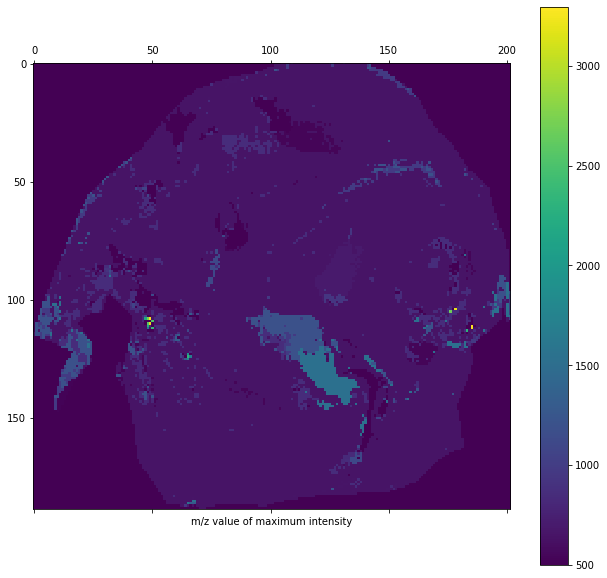

38178 0.0 1191.466796875 87.0994062793062


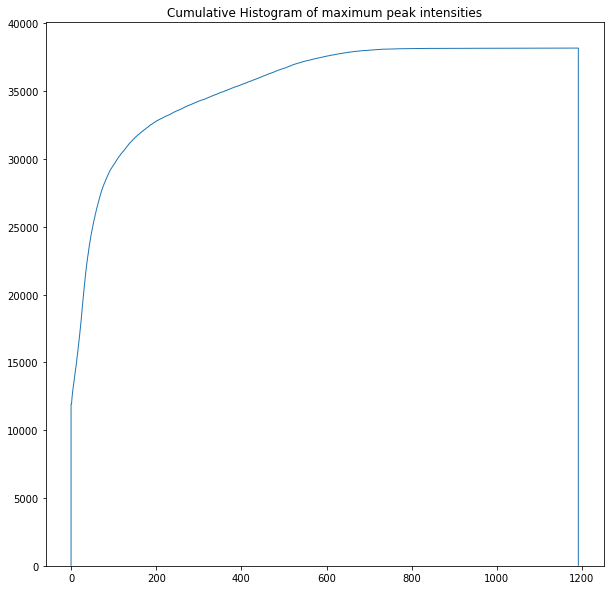

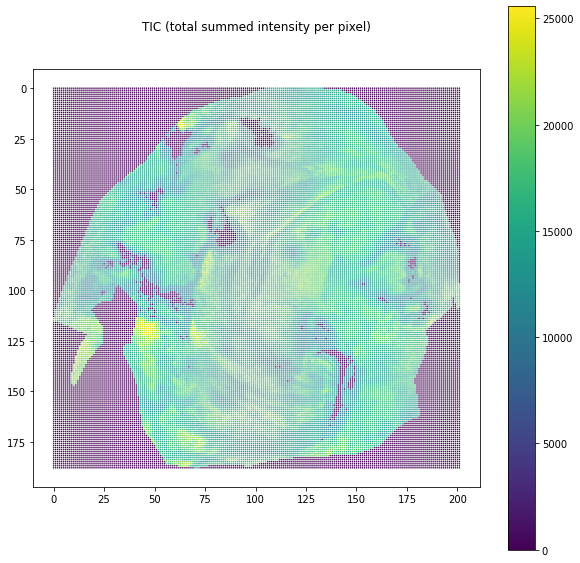

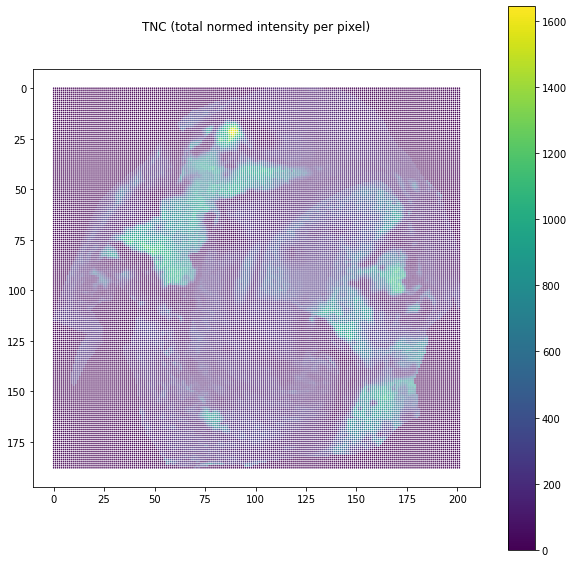

In [10]:
for regionArrayName in regionArrays:

    print(regionArrayName)
    regionArray, regionMasses = regionArrays[regionArrayName]
    imze.list_highest_peaks(regionArray, counter=False)   
    imze.plot_tic(regionArray)
    imze.plot_tnc(regionArray)

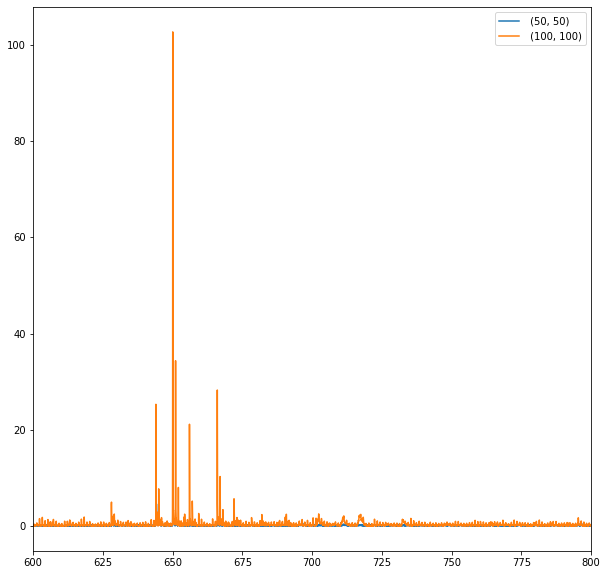

In [11]:
imze.plot_spectra(regionArrays["region_1"][0], [(50,50), (100, 100)], [600, 800], regionArrays["region_1"][1])

In [12]:
intRegionArrays = {}

for regionArrayName in regionArrays:

    regionArray, regionMasses = regionArrays[regionArrayName]

    print(regionArrayName)

    normArray = normalize_tic(regionArray)

    print("to peaks")
    #spectra_peaks, spectra_peaks_mz = imze.to_peaks(normArray, regionMasses, min_peak_prominence=0.1)
    print("to reduced peaks")

    hv_indices = imze.to_reduced_peaks(normArray, topn=8000, bins=30, return_indices=True)

    spectra_peaks_hvg = normArray[:, :, hv_indices]
    spectra_peaks_mz_hvg = regionMasses[hv_indices]

    intRegionArrays[regionArrayName] = (spectra_peaks_hvg, spectra_peaks_mz_hvg)


region_1


to peaks
to reduced peaks


|##########################################################| 100% Time: 0:00:25
/usr/local/lib/python3.8/dist-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


Returning 8000 highly-variable masses with z > 0.4542713835835457
(58400, 58400, 0.1452391, 0.4542713835835457, 0.5243915319442749, 0.6758294999599457, 216.6967)
Identified 8000 HV indices


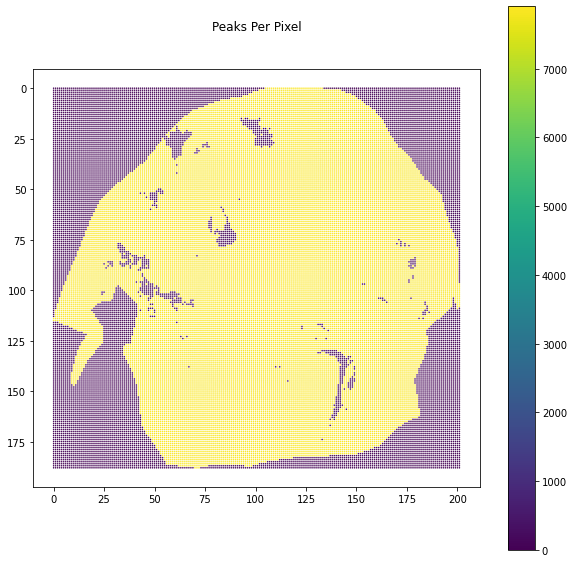

In [13]:
specArray = {}
for regionArrayName in intRegionArrays:
    regionArray, regionMZ = intRegionArrays[regionArrayName]
    imze.plot_ppp(regionArray)

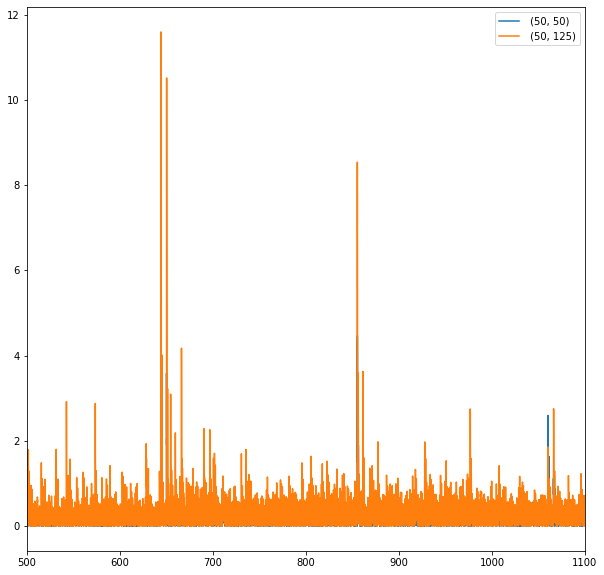

In [14]:
imze.plot_spectra(regionArrays["region_1"][0], [(50,50), (50, 125)], [500, 1100], regionArrays["region_1"][1])

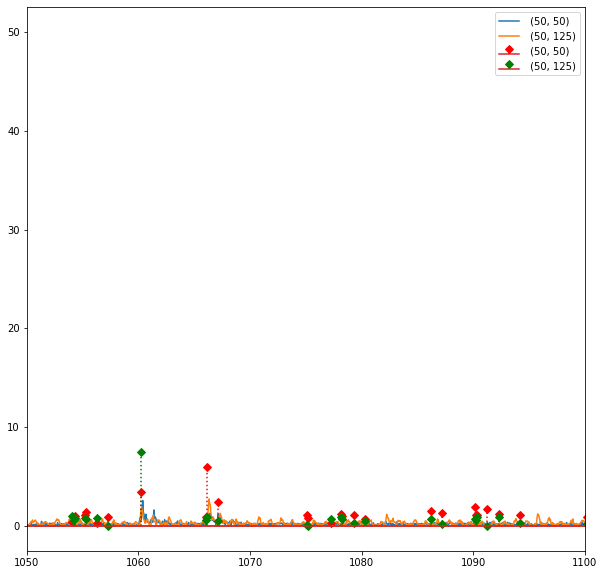

In [15]:
imze.plot_spectra(regionArrays["region_1"][0], [(50,50), (50, 125)], [1050, 1100], regionArrays["region_1"][1], end_plot=False)
imze.plot_spectra(intRegionArrays["region_1"][0], [(50,50), (50, 125)], [1050, 1100], intRegionArrays["region_1"][1], stems=True, start_plot=False)

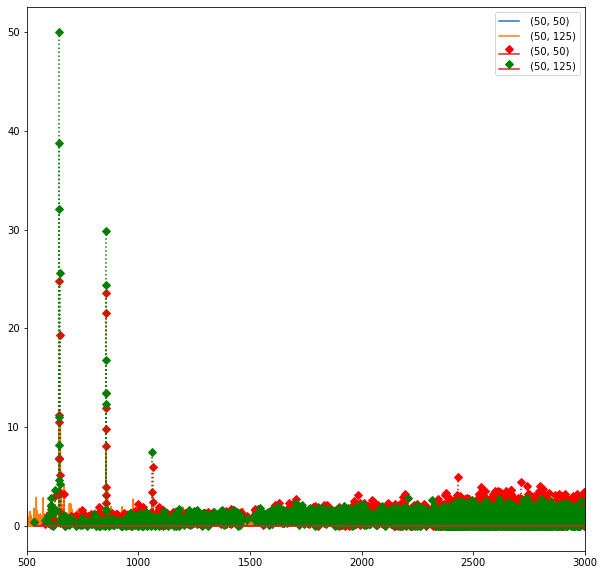

In [16]:
imze.plot_spectra(regionArrays["region_1"][0], [(50,50), (50, 125)], [500, 3000], regionArrays["region_1"][1], end_plot=False)
imze.plot_spectra(intRegionArrays["region_1"][0], [(50,50), (50, 125)], [500, 3000], intRegionArrays["region_1"][1], stems=True, start_plot=False)

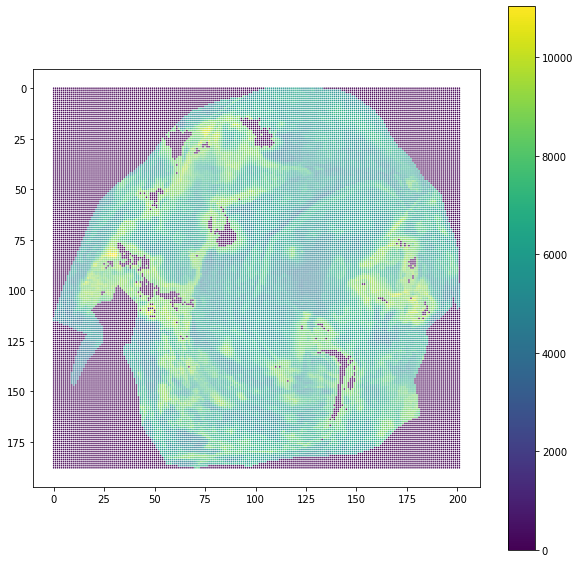

In [146]:
specArray = {}

for regionArrayName in intRegionArrays:

    regionArray, regionMZ = intRegionArrays[regionArrayName]

    spec = SpectraRegion(regionArray, regionMZ)
    spec.plot_tic()

    specArray[regionArrayName] = spec

Elem Matrix (38178, 8000)


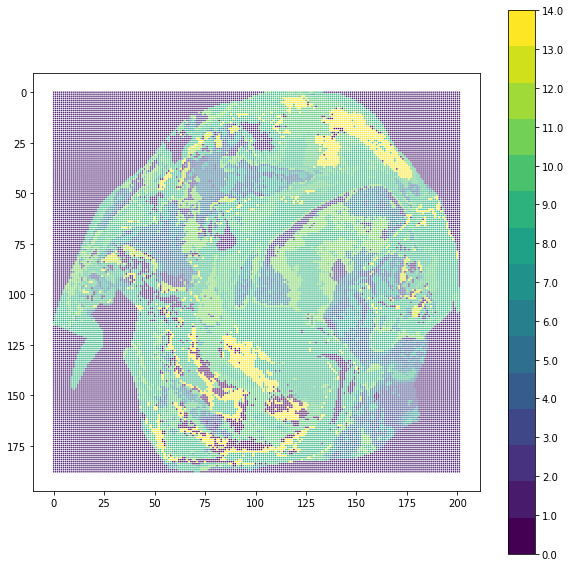

In [18]:
specClusterer = KMeansClusterer(specArray["region_1"])
_=specClusterer.fit_transform(15)
specClusterer.plot_segments()

|##########################################################| 100% Time: 0:03:29


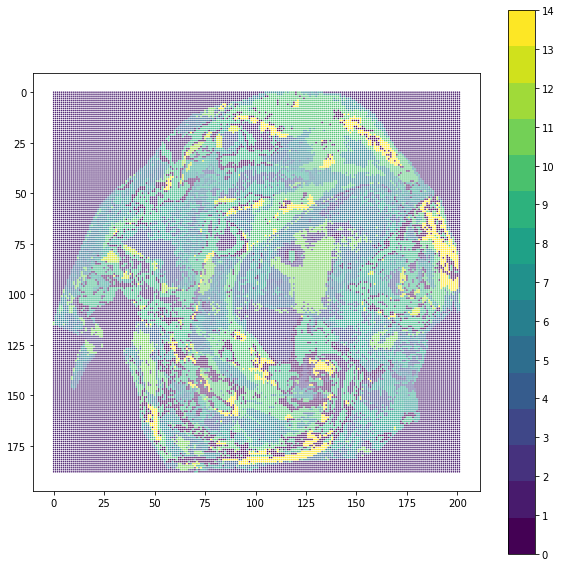

In [20]:
specClustererSC = ShrunkenCentroidClusterer(specArray["region_1"])
specClustererSC.fit(15, initialSegments = specClusterer.segmentation(), max_iterations=20 )
specClustererSC.plot_segments()

|##########################################################| 100% Time: 0:39:42


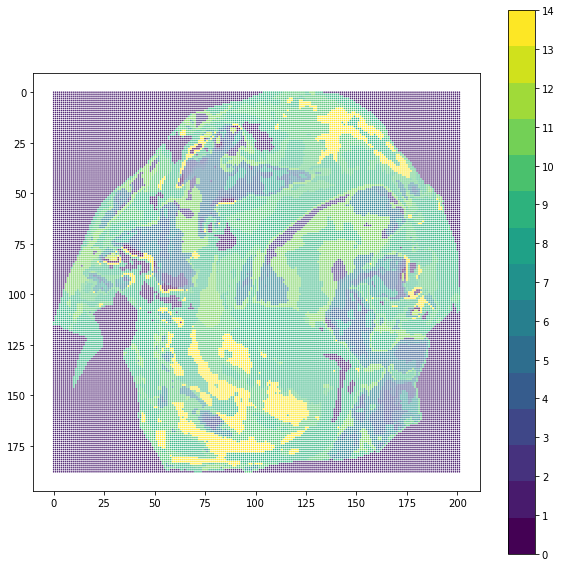

In [21]:
specClustererSA = SARegionClusterer(specArray["region_1"])
specClustererSA.fit(15, initialSegments = specClusterer.segmentation(), max_iterations=20 )
specClustererSA.plot_segments()

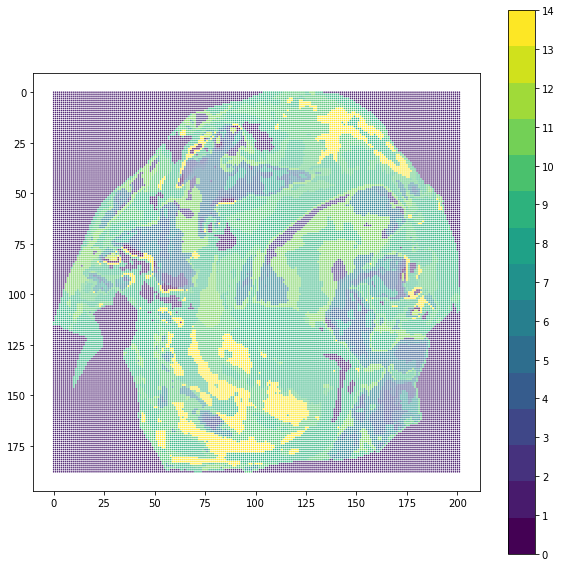

In [154]:
specArray["region_1"].segment_clusterer(specClustererSA)
specArray["region_1"].plot_segments()

In [2]:
plt.rcParams['figure.figsize'] = [10, 10]

specArray = {}
with open("peptide_slide.pickle", "rb") as fin:
    spec = pickle.load(fin)

    specArray["region_1"] = spec

2022-09-05 13:27:21,830  SpectraRegion  INFO: Added new Stream Handler


In [86]:
pcaEmbed = PCAEmbedding(specArray["region_1"], 10)
pcaEmbed.fit_transform()

Elem Matrix (38178, 8000)


2022-08-31 11:00:34,892  PCAEmbedding  INFO: PCA reduction
2022-08-31 11:00:34,893  PCAEmbedding  INFO: PCA fit+transform


In [92]:
pcaDF = pcaEmbed.loading()
pcaDF.sort_values("PC1", ascending=True)

,mass,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
378,1286.330063,0.000132,0.000108,0.001046,0.000965,0.003215,-0.008688,-0.005209,0.000288,-0.002222,-0.000248
636,1702.404201,0.000207,0.000422,0.001025,0.000717,0.003514,-0.009377,-0.005249,-0.000520,-0.002896,-0.000676
460,1395.227651,0.000218,0.000587,0.000910,0.000791,0.003664,-0.008348,-0.004949,-0.000595,-0.001606,0.000208
677,1732.469718,0.000220,0.000144,0.000983,0.000794,0.003114,-0.009201,-0.004819,0.000216,-0.002841,-0.000919
371,1267.005657,0.000237,0.000596,0.001079,0.000584,0.003563,-0.008130,-0.004556,-0.001109,-0.000991,-0.000101
...,...,...,...,...,...,...,...,...,...,...,...
17,650.015230,0.259395,-0.537131,0.708192,0.294285,-0.117533,-0.006309,0.120955,0.096529,-0.013613,-0.020972
80,856.062316,0.275739,-0.105997,-0.185629,-0.120037,0.057470,-0.002369,0.002223,0.037896,-0.082043,0.035644
75,855.103289,0.315057,0.117505,-0.282446,0.283271,-0.015196,-0.116892,0.363715,0.518345,-0.225423,-0.112801
11,644.117210,0.387629,0.491815,0.208441,-0.040304,-0.560532,0.009684,-0.330457,0.087753,-0.006920,0.291945


In [98]:
pcaDF[np.isclose(pcaDF["mass"], 1726.955309	)	]

,mass,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
668,1726.955309,0.000491,0.000512,0.000648,0.001654,0.002622,-0.01019,-0.006014,-0.000827,-0.002015,-0.001852


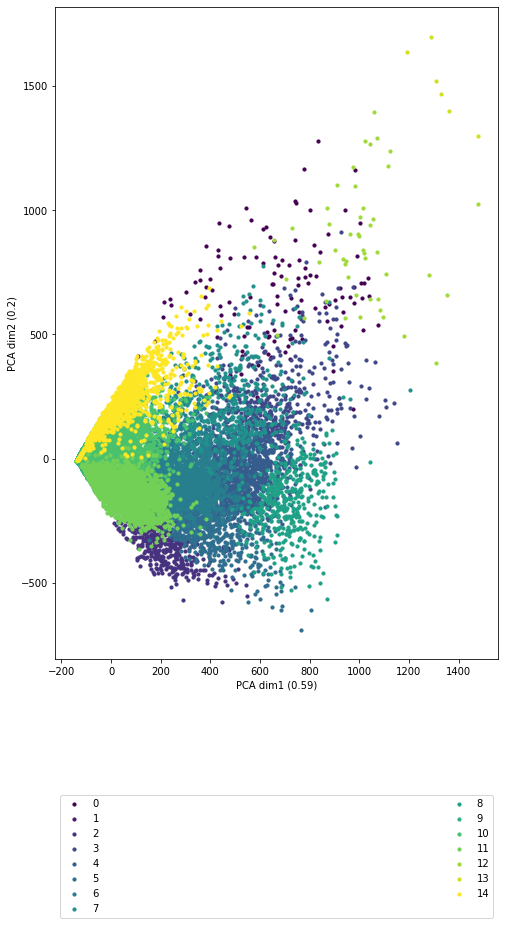

In [25]:
pcaEmbed.plot_embedding(colors=specArray["region_1"].segmented)

2022-08-31 10:07:34,256  SpectraRegion  INFO: Processing Mass 855.055337295857 with best existing mass 855.055337295857


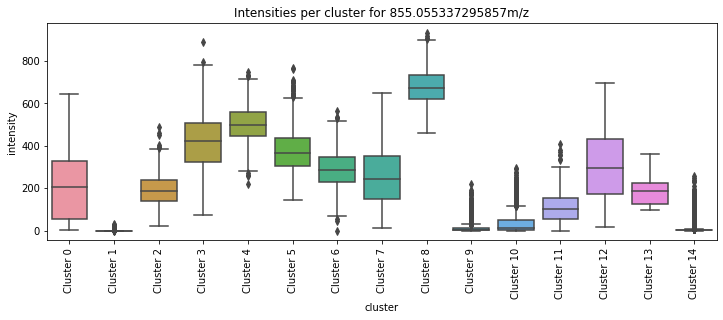

In [37]:
plt.figure(figsize=(12,4))
_ = specArray["region_1"].plot_boxplot(pcaDF.sort_values("PC1", ascending=False)["PC1"].index[0])

In [3]:
plt.rcParams['figure.figsize'] = [10, 10]

specArray = {}
with open("peptide_slide.pickle", "rb") as fin:
    spec = pickle.load(fin)

    specArray["region_1"] = spec

def namefunc(x):
    all_elems = [y.split("|")[-1].split(";") for y in x.strip().replace("_HUMAN", "").split()]

    retElems = set()
    for x in all_elems:
        for y in x:
            retElems.add(y)

    return retElems

pwfile = MaxquantPeptides(filename="PXD003930_peptides.tsv", ppm=5, encoding="ASCII", name_column="Proteins", name_function=namefunc)

2022-09-05 14:03:24,140  ProteinWeights  INFO: Added new Stream Handler
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:510: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  indf = pd.read_csv(inputfile, sep="\t", encoding=encoding, error_bad_lines=error_bad_lines, warn_bad_lines=warn_bad_lines, dtype="O")
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:510: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  indf = pd.read_csv(inputfile, sep="\t", encoding=encoding, error_bad_lines=error_bad_lines, warn_bad_lines=warn_bad_lines, dtype="O")
2022-09-05 14:03:25,051  ProteinWeights  ERROR: Unable to process line 3326: Sequence                                   EMQLDGYSIFAIGVADADYSELVSIGSKPSAR
N-term cleavage window                                     DDVNKISREMQLDGYS
C-term cleavage window    

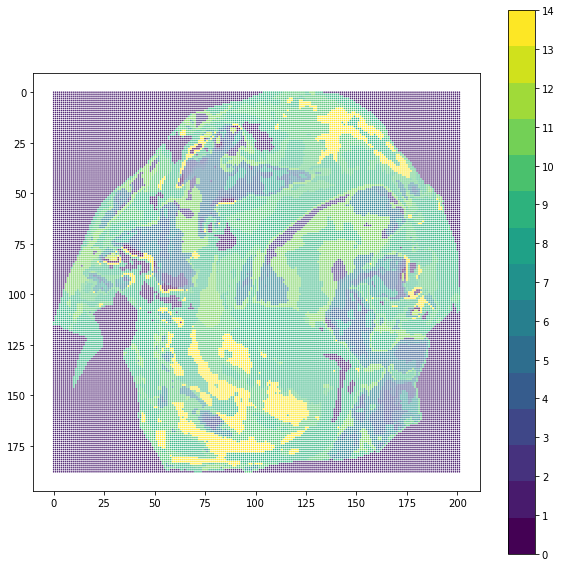

In [4]:
specArray["region_1"].plot_segments()

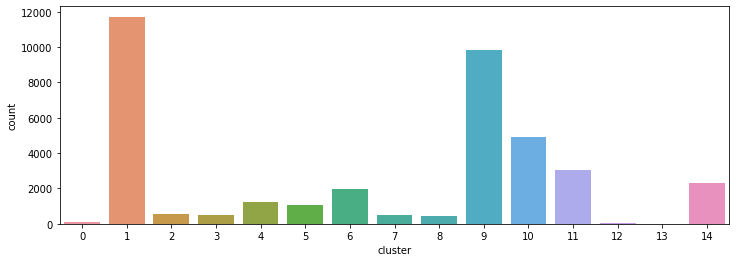

In [5]:
plt.figure(figsize=(12,4))
specArray["region_1"].plot_segment_counts()

In [31]:
spec_detest = DifferentialTTest({"peptide_1": specArray["region_1"]})

2022-09-05 15:10:17,382  Differential  INFO: Added new Stream Handler


In [7]:
df = spec_detest.do_de_analysis({"peptide_1": [6]}, {"peptide_1": [0,1,2,3,4,5,7,8,9,10,11,12,13,14]}, "segmented")
df.head()

2022-09-05 13:28:20,316  Differential  INFO: Preparing common features
2022-09-05 13:28:20,320  Differential  INFO: Identified 8000 common features
2022-09-05 13:28:20,320  Differential  INFO: Preparing input masks
2022-09-05 13:28:20,323  Differential  INFO: For region peptide_1 identified 1948 of 38178 pixels for group1
2022-09-05 13:28:20,324  Differential  INFO: For region peptide_1 identified 36230 of 38178 pixels for group2
2022-09-05 13:28:20,325  Differential  INFO: Got all input masks
|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj
0,2736.331891,0.913244,0.616230,1779,1948,22326,36230,0.684715,0.766995,-0.163714,3.801936e-22,5.557370e-22
1,2614.007917,0.898871,0.609136,1751,1948,22069,36230,0.670564,0.760246,-0.181091,6.660933e-27,1.466762e-26
2,2661.192076,0.900411,0.604996,1754,1948,21919,36230,0.668655,0.740921,-0.148058,2.613190e-17,2.956933e-17
3,2785.721814,0.877823,0.604306,1710,1948,21894,36230,0.640752,0.735484,-0.198927,2.080162e-29,5.929463e-29
4,2583.846498,0.878337,0.601877,1711,1948,21806,36230,0.650175,0.758718,-0.222735,8.253176e-36,4.085730e-35


In [32]:
markers = spec_detest.find_markers(["peptide_1"])

2022-09-05 15:10:22,249  Differential  INFO: Running markers for sample peptide_1 and cluster 0
2022-09-05 15:10:22,250  Differential  INFO: Preparing common features
2022-09-05 15:10:22,253  Differential  INFO: Identified 8000 common features
2022-09-05 15:10:22,254  Differential  INFO: Preparing input masks
2022-09-05 15:10:22,257  Differential  INFO: For region peptide_1 identified 123 of 38178 pixels for group1
2022-09-05 15:10:22,258  Differential  INFO: For region peptide_1 identified 38055 of 38178 pixels for group2
2022-09-05 15:10:22,259  Differential  INFO: Got all input masks


('peptide_1', 0)
{'peptide_1': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:10:37,478  Differential  INFO: Running markers for sample peptide_1 and cluster 1
2022-09-05 15:10:37,478  Differential  INFO: Preparing common features
2022-09-05 15:10:37,481  Differential  INFO: Identified 8000 common features
2022-09-05 15:10:37,482  Differential  INFO: Preparing input masks
2022-09-05 15:10:37,484  Differential  INFO: For region peptide_1 identified 11715 of 38178 pixels for group1
2022-09-05 15:10:37,485  Differential  INFO: For region peptide_1 identified 26463 of 38178 pixels for group2
2022-09-05 15:10:37,486  Differential  INFO: Got all input masks


('peptide_1', 1)
{'peptide_1': [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:10:53,213  Differential  INFO: Running markers for sample peptide_1 and cluster 2
2022-09-05 15:10:53,214  Differential  INFO: Preparing common features
2022-09-05 15:10:53,217  Differential  INFO: Identified 8000 common features
2022-09-05 15:10:53,217  Differential  INFO: Preparing input masks
2022-09-05 15:10:53,220  Differential  INFO: For region peptide_1 identified 558 of 38178 pixels for group1
2022-09-05 15:10:53,221  Differential  INFO: For region peptide_1 identified 37620 of 38178 pixels for group2
2022-09-05 15:10:53,222  Differential  INFO: Got all input masks


('peptide_1', 2)
{'peptide_1': [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:11:08,651  Differential  INFO: Running markers for sample peptide_1 and cluster 3
2022-09-05 15:11:08,652  Differential  INFO: Preparing common features
2022-09-05 15:11:08,654  Differential  INFO: Identified 8000 common features
2022-09-05 15:11:08,655  Differential  INFO: Preparing input masks
2022-09-05 15:11:08,658  Differential  INFO: For region peptide_1 identified 476 of 38178 pixels for group1
2022-09-05 15:11:08,658  Differential  INFO: For region peptide_1 identified 37702 of 38178 pixels for group2
2022-09-05 15:11:08,659  Differential  INFO: Got all input masks


('peptide_1', 3)
{'peptide_1': [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:11:24,038  Differential  INFO: Running markers for sample peptide_1 and cluster 4
2022-09-05 15:11:24,038  Differential  INFO: Preparing common features
2022-09-05 15:11:24,041  Differential  INFO: Identified 8000 common features
2022-09-05 15:11:24,042  Differential  INFO: Preparing input masks
2022-09-05 15:11:24,045  Differential  INFO: For region peptide_1 identified 1224 of 38178 pixels for group1
2022-09-05 15:11:24,045  Differential  INFO: For region peptide_1 identified 36954 of 38178 pixels for group2
2022-09-05 15:11:24,046  Differential  INFO: Got all input masks


('peptide_1', 4)
{'peptide_1': [0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:11:39,861  Differential  INFO: Running markers for sample peptide_1 and cluster 5
2022-09-05 15:11:39,862  Differential  INFO: Preparing common features
2022-09-05 15:11:39,865  Differential  INFO: Identified 8000 common features
2022-09-05 15:11:39,865  Differential  INFO: Preparing input masks
2022-09-05 15:11:39,868  Differential  INFO: For region peptide_1 identified 1041 of 38178 pixels for group1
2022-09-05 15:11:39,869  Differential  INFO: For region peptide_1 identified 37137 of 38178 pixels for group2
2022-09-05 15:11:39,870  Differential  INFO: Got all input masks


('peptide_1', 5)
{'peptide_1': [0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:11:55,529  Differential  INFO: Running markers for sample peptide_1 and cluster 6
2022-09-05 15:11:55,530  Differential  INFO: Preparing common features
2022-09-05 15:11:55,532  Differential  INFO: Identified 8000 common features
2022-09-05 15:11:55,533  Differential  INFO: Preparing input masks
2022-09-05 15:11:55,536  Differential  INFO: For region peptide_1 identified 1948 of 38178 pixels for group1
2022-09-05 15:11:55,536  Differential  INFO: For region peptide_1 identified 36230 of 38178 pixels for group2
2022-09-05 15:11:55,537  Differential  INFO: Got all input masks


('peptide_1', 6)
{'peptide_1': [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:12:11,277  Differential  INFO: Running markers for sample peptide_1 and cluster 7
2022-09-05 15:12:11,278  Differential  INFO: Preparing common features
2022-09-05 15:12:11,280  Differential  INFO: Identified 8000 common features
2022-09-05 15:12:11,281  Differential  INFO: Preparing input masks
2022-09-05 15:12:11,284  Differential  INFO: For region peptide_1 identified 476 of 38178 pixels for group1
2022-09-05 15:12:11,284  Differential  INFO: For region peptide_1 identified 37702 of 38178 pixels for group2
2022-09-05 15:12:11,285  Differential  INFO: Got all input masks


('peptide_1', 7)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:12:26,605  Differential  INFO: Running markers for sample peptide_1 and cluster 8
2022-09-05 15:12:26,605  Differential  INFO: Preparing common features
2022-09-05 15:12:26,608  Differential  INFO: Identified 8000 common features
2022-09-05 15:12:26,609  Differential  INFO: Preparing input masks
2022-09-05 15:12:26,612  Differential  INFO: For region peptide_1 identified 418 of 38178 pixels for group1
2022-09-05 15:12:26,612  Differential  INFO: For region peptide_1 identified 37760 of 38178 pixels for group2
2022-09-05 15:12:26,613  Differential  INFO: Got all input masks


('peptide_1', 8)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:12:41,809  Differential  INFO: Running markers for sample peptide_1 and cluster 9
2022-09-05 15:12:41,809  Differential  INFO: Preparing common features
2022-09-05 15:12:41,812  Differential  INFO: Identified 8000 common features
2022-09-05 15:12:41,813  Differential  INFO: Preparing input masks
2022-09-05 15:12:41,816  Differential  INFO: For region peptide_1 identified 9860 of 38178 pixels for group1
2022-09-05 15:12:41,816  Differential  INFO: For region peptide_1 identified 28318 of 38178 pixels for group2
2022-09-05 15:12:41,817  Differential  INFO: Got all input masks


('peptide_1', 9)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:16
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:12:57,996  Differential  INFO: Running markers for sample peptide_1 and cluster 10
2022-09-05 15:12:57,996  Differential  INFO: Preparing common features
2022-09-05 15:12:57,999  Differential  INFO: Identified 8000 common features
2022-09-05 15:12:58,000  Differential  INFO: Preparing input masks
2022-09-05 15:12:58,002  Differential  INFO: For region peptide_1 identified 4923 of 38178 pixels for group1
2022-09-05 15:12:58,003  Differential  INFO: For region peptide_1 identified 33255 of 38178 pixels for group2
2022-09-05 15:12:58,004  Differential  INFO: Got all input masks


('peptide_1', 10)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:16
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:13:14,136  Differential  INFO: Running markers for sample peptide_1 and cluster 11
2022-09-05 15:13:14,137  Differential  INFO: Preparing common features
2022-09-05 15:13:14,140  Differential  INFO: Identified 8000 common features
2022-09-05 15:13:14,140  Differential  INFO: Preparing input masks
2022-09-05 15:13:14,143  Differential  INFO: For region peptide_1 identified 3036 of 38178 pixels for group1
2022-09-05 15:13:14,144  Differential  INFO: For region peptide_1 identified 35142 of 38178 pixels for group2
2022-09-05 15:13:14,144  Differential  INFO: Got all input masks


('peptide_1', 11)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:13:29,939  Differential  INFO: Running markers for sample peptide_1 and cluster 12
2022-09-05 15:13:29,939  Differential  INFO: Preparing common features
2022-09-05 15:13:29,942  Differential  INFO: Identified 8000 common features
2022-09-05 15:13:29,943  Differential  INFO: Preparing input masks
2022-09-05 15:13:29,946  Differential  INFO: For region peptide_1 identified 48 of 38178 pixels for group1
2022-09-05 15:13:29,946  Differential  INFO: For region peptide_1 identified 38130 of 38178 pixels for group2
2022-09-05 15:13:29,947  Differential  INFO: Got all input masks


('peptide_1', 12)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:13:44,993  Differential  INFO: Running markers for sample peptide_1 and cluster 13
2022-09-05 15:13:44,994  Differential  INFO: Preparing common features
2022-09-05 15:13:44,996  Differential  INFO: Identified 8000 common features
2022-09-05 15:13:44,997  Differential  INFO: Preparing input masks
2022-09-05 15:13:45,000  Differential  INFO: For region peptide_1 identified 6 of 38178 pixels for group1
2022-09-05 15:13:45,000  Differential  INFO: For region peptide_1 identified 38172 of 38178 pixels for group2
2022-09-05 15:13:45,001  Differential  INFO: Got all input masks


('peptide_1', 13)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1
2022-09-05 15:14:00,036  Differential  INFO: Running markers for sample peptide_1 and cluster 14
2022-09-05 15:14:00,036  Differential  INFO: Preparing common features
2022-09-05 15:14:00,039  Differential  INFO: Identified 8000 common features
2022-09-05 15:14:00,040  Differential  INFO: Preparing input masks
2022-09-05 15:14:00,043  Differential  INFO: For region peptide_1 identified 2326 of 38178 pixels for group1
2022-09-05 15:14:00,043  Differential  INFO: For region peptide_1 identified 35852 of 38178 pixels for group2
2022-09-05 15:14:00,044  Differential  INFO: Got all input masks


('peptide_1', 14)
{'peptide_1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]}


|##########################################################| 100% Time: 0:00:15
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/differential.py:304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pvals[np.isnan(pvals)] = 1


In [9]:
markers[("peptide_1", 6)].sort_values("p_value_adj")

,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj
82,855.055337,0.999487,0.653271,1947,1948,23668,36230,288.759918,100.700231,1.519804,0.000000,0.000000
93,871.023147,0.999487,0.651918,1947,1948,23619,36230,34.783609,9.325470,1.899159,0.000000,0.000000
16,629.060476,0.999487,0.665636,1947,1948,24116,36230,32.326407,11.091513,1.543257,0.000000,0.000000
83,855.103289,0.999487,0.661496,1947,1948,23966,36230,124.304702,56.479944,1.138070,0.000000,0.000000
88,856.062316,0.999487,0.667513,1947,1948,24184,36230,121.950743,42.401718,1.524104,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
136,961.171745,0.971253,0.617886,1892,1948,22386,36230,0.738444,0.741052,-0.005086,0.707804,0.708158
259,1130.296268,0.970226,0.628678,1890,1948,22777,36230,0.766720,0.764988,0.003263,0.810306,0.810610
285,1175.226712,0.983060,0.639222,1915,1948,23159,36230,0.844480,0.845451,-0.001657,0.901688,0.901913
203,1039.188643,0.960472,0.615981,1871,1948,22317,36230,0.715131,0.715661,-0.001068,0.937981,0.938099


In [29]:
def namefunc(x):
    all_elems = [y.split("|")[-1].split(";") for y in x.strip().replace("_HUMAN", "").split()]

    retElems = set()
    for x in all_elems:
        for y in x:
            retElems.add(y)

    return retElems

pwfile = MaxquantPeptides(filename="PXD003930_peptides.tsv", ppm=5, encoding="ASCII", name_column="Proteins", name_function=namefunc)

/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:510: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  indf = pd.read_csv(inputfile, sep="\t", encoding=encoding, error_bad_lines=error_bad_lines, warn_bad_lines=warn_bad_lines, dtype="O")
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:510: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  indf = pd.read_csv(inputfile, sep="\t", encoding=encoding, error_bad_lines=error_bad_lines, warn_bad_lines=warn_bad_lines, dtype="O")
2022-09-05 15:09:47,690  ProteinWeights  ERROR: Unable to process line 3326: Sequence                                   EMQLDGYSIFAIGVADADYSELVSIGSKPSAR
N-term cleavage window                                     DDVNKISREMQLDGYS
C-term cleavage window                                     IGSKPSARHVFFVDDF
Amino acid before     

In [11]:
pwfile.annotate_df(df, mass_column="feature")

,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
0,2736.331891,0.913244,0.616230,1779,1948,22326,36230,0.684715,0.766995,-0.163714,3.801936e-22,5.557370e-22,0,[]
1,2614.007917,0.898871,0.609136,1751,1948,22069,36230,0.670564,0.760246,-0.181091,6.660933e-27,1.466762e-26,0,[]
2,2661.192076,0.900411,0.604996,1754,1948,21919,36230,0.668655,0.740921,-0.148058,2.613190e-17,2.956933e-17,0,[]
3,2785.721814,0.877823,0.604306,1710,1948,21894,36230,0.640752,0.735484,-0.198927,2.080162e-29,5.929463e-29,0,[]
4,2583.846498,0.878337,0.601877,1711,1948,21806,36230,0.650175,0.758718,-0.222735,8.253176e-36,4.085730e-35,0,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,2645.320169,0.918378,0.620784,1789,1948,22491,36230,0.694826,0.784746,-0.175574,2.014693e-26,4.248166e-26,0,[]
7996,2400.048852,0.916838,0.613773,1786,1948,22237,36230,0.701816,0.789793,-0.170381,4.458601e-25,8.291216e-25,0,[]
7997,2400.576317,0.881417,0.603395,1717,1948,21861,36230,0.662012,0.770960,-0.219799,3.939026e-38,2.263808e-37,0,[]
7998,2808.738477,0.879877,0.603229,1714,1948,21855,36230,0.646768,0.733042,-0.180649,7.652508e-23,1.177309e-22,0,[]


In [12]:
pwfile.annotate_dfs(markers, mass_column="feature")

In [13]:
upreg_markers = {}

for x in markers:
    sdf = markers[x].loc[lambda x: x["#matches"]!= 0].loc[lambda x: x["log2FC"]> 0].sort_values("log2FC", ascending=False)
    if sdf.shape[0] > 0:
        upreg_markers[x] = sdf

In [14]:
for x in upreg_markers:
    print(x)
    display(upreg_markers[x])

('peptide_1', 1)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2406,1915.931704,0.006914,0.967917,81,11715,25614,26463,1.612535,0.935263,0.785887,5.290183e-15,1.322546e-12,3,"[TPM1, FA12, DHE3]"
2475,1979.035722,0.006914,0.962174,81,11715,25462,26463,1.489865,0.888891,0.745104,9.727550e-12,1.525890e-09,2,"[PNPH, PGM5]"
882,1940.914373,0.006914,0.969051,81,11715,25644,26463,1.486905,0.892723,0.736027,3.369508e-12,5.840664e-10,2,"[MAP1B, CO9]"
2409,1916.938683,0.006914,0.972036,81,11715,25723,26463,1.542815,0.950651,0.698577,8.571063e-16,2.364431e-13,1,[MYH10]
736,1794.902416,0.006914,0.968258,81,11715,25623,26463,1.530192,0.972785,0.653520,7.553236e-14,1.590155e-11,4,"[MMP9, SPTA1, TENS1, TPM2]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2731,2184.123781,0.006829,0.907607,80,11715,24018,26463,0.815731,0.815243,0.000864,9.904693e-01,9.935742e-01,2,"[CON__P04264, K2C1]"
3387,2458.309781,0.006061,0.884329,71,11715,23402,26463,0.772019,0.771591,0.000801,9.931353e-01,9.952502e-01,1,[PDXK]
3614,2518.105154,0.006317,0.889544,74,11715,23540,26463,0.758360,0.758086,0.000521,9.950397e-01,9.963446e-01,1,[CLIC4]
3004,2380.101077,0.006658,0.909723,78,11715,24074,26463,0.798739,0.798542,0.000356,9.962111e-01,9.969589e-01,2,"[ANXA6, VINC]"


('peptide_1', 2)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
6912,2615.302604,0.928315,0.633493,518,558,23832,37620,0.810798,0.785332,0.046040,0.132813,0.140953,1,[ICAL]
7043,2614.247674,0.906810,0.612068,506,558,23026,37620,0.749371,0.733276,0.031323,0.378690,0.388450,1,[PDIA1]
6011,2999.249316,0.940860,0.627379,525,558,23602,37620,0.748925,0.742886,0.011679,0.694424,0.701261,1,[TSP1]
7313,2614.343576,0.917563,0.627645,512,558,23612,37620,0.779561,0.773977,0.010370,0.732148,0.738296,1,[ALDOA]
991,2049.859912,0.996416,0.672382,556,558,25295,37620,0.980128,0.973317,0.010060,0.655204,0.662826,1,[GAS6]
6525,2802.265041,0.919355,0.625465,513,558,23530,37620,0.741370,0.737736,0.007088,0.811038,0.815728,1,[IGHG4]
2245,2545.149733,0.928315,0.629080,518,558,23666,37620,0.802363,0.799266,0.005579,0.837690,0.841899,2,"[ALBU, CON__P02768-1]"
2601,2102.894140,0.983871,0.665630,549,558,25041,37620,0.890492,0.888091,0.003895,0.863847,0.867752,1,[ASPH]
7967,2592.046184,0.930108,0.611271,519,558,22996,37620,0.736397,0.735152,0.002442,0.931501,0.932550,1,[COMP]


('peptide_1', 7)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2379,1898.093790,0.989496,0.667100,471,476,25151,37702,0.966338,0.887777,0.122332,0.000012,0.000150,1,[ANGT]
4969,2786.345182,0.892857,0.628879,425,476,23710,37702,0.781378,0.745181,0.068432,0.058264,0.166527,1,[HS71L]
5225,2562.364279,0.905462,0.618243,431,476,23309,37702,0.800274,0.766503,0.062203,0.063166,0.176257,2,"[GAS6, IQGA1]"
6354,2532.298763,0.871849,0.607209,415,476,22893,37702,0.777488,0.747041,0.057633,0.118030,0.267870,1,[APOE]
3599,2514.221092,0.903361,0.612965,430,476,23110,37702,0.796842,0.765846,0.057240,0.117190,0.266985,2,"[PGK1, C1QB]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3983,2591.278962,0.907563,0.617103,432,476,23266,37702,0.747809,0.747334,0.000916,0.978716,0.990103,1,[AK1C2]
3423,2468.139814,0.903361,0.631691,430,476,23816,37702,0.800253,0.799778,0.000856,0.979799,0.990691,1,[LMAN2]
6917,2739.304877,0.918067,0.633945,437,476,23901,37702,0.772032,0.771693,0.000634,0.984268,0.992703,1,[GDIR2]
5200,2832.378508,0.899160,0.622248,428,476,23460,37702,0.733099,0.732960,0.000272,0.993950,0.997441,2,"[LPP, CATD]"


('peptide_1', 8)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2379,1898.093790,1.000000,0.667479,418,418,25204,37760,1.011135,0.887199,0.188646,3.082166e-11,3.734261e-11,1,[ANGT]
790,1844.963659,0.990431,0.671398,414,418,25352,37760,0.995038,0.992898,0.003105,9.068800e-01,9.074472e-01,2,"[CLIC1, MK01]"


('peptide_1', 9)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2598,2100.736328,0.957809,0.569037,9444,9860,16114,28318,1.028393,0.800456,0.361496,0.000000e+00,0.000000e+00,1,[SPRL1]
1133,2193.857911,0.960446,0.570626,9470,9860,16159,28318,0.963746,0.769021,0.325629,0.000000e+00,0.000000e+00,1,[1433G]
1218,2272.977691,0.956288,0.568825,9429,9860,16108,28318,0.981109,0.796769,0.300252,1.342803e-265,3.235669e-264,2,"[CO4A, LAMB2]"
1127,2180.911038,0.958519,0.567484,9451,9860,16070,28318,0.932124,0.757201,0.299846,5.268624e-286,1.572723e-284,1,[1433E]
3293,2438.889471,0.895538,0.518222,8830,9860,14675,28318,0.869425,0.706570,0.299230,2.317022e-185,2.887254e-184,1,[TENA]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
796,1849.998554,0.951420,0.575888,9381,9860,16308,28318,0.971054,0.930965,0.060824,2.210819e-14,2.234561e-14,2,"[ACADV, VPLEMEHVIGLNNTKR_1849.988]"
717,1773.995614,0.949899,0.576453,9366,9860,16324,28318,0.961047,0.922705,0.058738,6.753343e-14,6.821558e-14,1,[MUCB]
785,1841.990673,0.952535,0.577407,9392,9860,16351,28318,0.978626,0.940013,0.058077,6.829695e-13,6.894329e-13,4,"[TRFL, CO3, ANK1, PYGB]"
790,1844.963659,0.948783,0.579525,9355,9860,16411,28318,1.005494,0.985772,0.028578,2.285563e-04,2.293879e-04,2,"[CLIC1, MK01]"


('peptide_1', 10)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
670,1726.955309,0.981109,0.623726,4830,4923,20742,33255,1.128117,0.873582,0.368902,0.000000e+00,0.000000e+00,2,"[ANXA5, MYH9]"
2296,1766.035685,0.979890,0.624718,4824,4923,20775,33255,1.088441,0.850806,0.355361,0.000000e+00,0.000000e+00,1,[LIMC1]
2367,1886.010041,0.981718,0.630011,4833,4923,20951,33255,1.159113,0.912882,0.344521,6.694379e-275,1.217160e-272,1,[ACTN1]
788,1844.052583,0.979281,0.620689,4821,4923,20641,33255,1.097135,0.866575,0.340344,2.756670e-268,4.594450e-266,1,[ALDH2]
2398,1906.053719,0.977656,0.619366,4813,4923,20597,33255,1.043712,0.827705,0.334534,3.542398e-266,5.783507e-264,1,[CATD]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6106,3029.458687,0.894780,0.582920,4405,4923,19385,33255,0.721821,0.721612,0.000418,9.736673e-01,9.792725e-01,1,[CO6A1]
5222,2837.317501,0.902702,0.585747,4444,4923,19479,33255,0.734057,0.733850,0.000407,9.733235e-01,9.791987e-01,1,[LMNB1]
7686,2629.256456,0.912046,0.593625,4490,4923,19741,33255,0.772071,0.771961,0.000205,9.866015e-01,9.903152e-01,1,[HBD]
2664,2157.990278,0.968718,0.630191,4769,4923,20957,33255,0.860352,0.860239,0.000189,9.836240e-01,9.875743e-01,1,[1433F]


('peptide_1', 11)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
880,1939.811492,0.986495,0.637585,2995,3036,22406,35142,1.007834,0.859973,0.228896,8.729220e-84,8.828541e-83,2,"[PGBM, GDIR2]"
1176,2230.972281,0.987154,0.642081,2997,3036,22564,35142,0.972215,0.849253,0.195081,1.517755e-59,1.184589e-58,1,[GLYG]
2406,1915.931704,0.986166,0.645979,2994,3036,22701,35142,1.041318,0.923692,0.172927,2.142773e-48,1.299635e-47,3,"[TPM1, FA12, DHE3]"
2542,2032.885123,0.990119,0.647004,3006,3036,22737,35142,1.017650,0.911468,0.158978,9.492149e-48,5.612505e-47,1,[TRFL]
1137,2188.007843,0.980237,0.642280,2976,3036,22571,35142,0.922963,0.828113,0.156446,1.229954e-36,4.501403e-36,1,[LPP]
2601,2102.894140,0.990119,0.642650,3006,3036,22584,35142,0.975453,0.876521,0.154284,2.651321e-45,1.428321e-44,1,[ASPH]
991,2049.859912,0.995059,0.649650,3021,3036,22830,35142,1.068444,0.960895,0.153060,8.411107e-49,5.164148e-48,1,[GAS6]
964,2017.876341,0.986495,0.643048,2995,3036,22598,35142,0.956927,0.862473,0.149929,4.176591e-42,1.993599e-41,1,[FHL3]
948,2008.861481,0.991436,0.645552,3010,3036,22686,35142,0.985798,0.888938,0.149210,6.769513e-44,3.467100e-43,1,[FBLI1]
940,1995.914608,0.982213,0.639633,2982,3036,22478,35142,0.957381,0.864214,0.147704,7.343476e-40,3.182438e-39,1,[FA12]


('peptide_1', 12)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
4739,2741.318835,0.916667,0.63315,44,48,24142,38130,0.776897,0.762357,0.027255,0.819038,0.821194,1,[COEA1]


('peptide_1', 13)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2157,2689.339537,0.666667,0.616604,4,6,23537,38172,0.806817,0.731663,0.141063,0.621532,0.643324,2,"[RHG01, AL1B1]"
6438,2730.385920,0.833333,0.629467,5,6,24028,38172,0.806549,0.762024,0.081926,0.644604,0.665311,1,[APOE]
7686,2629.256456,0.833333,0.634654,5,6,24226,38172,0.806154,0.771974,0.062502,0.367682,0.402180,1,[HBD]
6681,2502.233246,0.500000,0.630907,3,6,24083,38172,0.831081,0.796117,0.062009,0.916011,0.921425,1,[IDH3A]
6688,2626.235519,0.666667,0.636278,4,6,24288,38172,0.800682,0.770198,0.056000,0.821514,0.833390,2,"[APOB, TENX]"
5827,2959.593524,0.500000,0.618071,3,6,23593,38172,0.758520,0.729976,0.055338,0.820278,0.832241,1,[A2GL]
7849,2471.304605,0.833333,0.614194,5,6,23445,38172,0.788372,0.760771,0.051413,0.871101,0.879678,1,[SGCB]
6423,2765.486331,0.833333,0.621607,5,6,23728,38172,0.769147,0.742413,0.051038,0.817666,0.830013,1,[COEA1]
1567,2625.276491,1.000000,0.632977,6,6,24162,38172,0.790384,0.765450,0.046245,0.866514,0.875599,1,[AHNK]
1478,2530.332756,0.666667,0.616892,4,6,23548,38172,0.776876,0.759886,0.031902,0.946052,0.950328,1,[RPN2]


('peptide_1', 14)


,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2400,1910.129586,0.982803,0.640132,2286,2326,22950,35852,0.996782,0.814784,0.290861,1.041431e-104,3.074336e-103,1,[PGS1]
851,1908.115628,0.987962,0.648918,2298,2326,23265,35852,1.069486,0.876247,0.287509,1.921049e-104,5.629449e-103,1,[A2MG]
1164,2224.259087,0.979794,0.637342,2279,2326,22850,35852,0.863345,0.751975,0.199252,1.260634e-46,1.514275e-45,1,[APOA1]
2527,2019.171028,0.977214,0.633242,2273,2326,22703,35852,0.868977,0.759204,0.194830,5.965816e-46,7.060138e-45,2,"[PRDX2, ITB1]"
850,1907.060698,0.987962,0.653325,2298,2326,23423,35852,1.027988,0.913148,0.170904,1.982906e-40,2.173047e-39,1,[PRDX1]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3345,2448.048185,0.927773,0.625377,2158,2326,22421,35852,0.829864,0.828580,0.002234,8.867203e-01,8.944172e-01,1,[CO4A2]
3082,2395.109860,0.921324,0.624540,2143,2326,22391,35852,0.825302,0.824078,0.002140,8.919044e-01,8.990971e-01,1,[IGHD]
4565,2706.218424,0.933792,0.620746,2172,2326,22255,35852,0.803511,0.802425,0.001952,9.019422e-01,9.085291e-01,1,[MYH11]
2710,2178.081907,0.889940,0.610231,2070,2326,21878,35852,0.796232,0.795457,0.001405,9.298960e-01,9.340995e-01,2,"[ITIH2, TENX]"


In [22]:
cdf = spec_detest.combine_dfs(upreg_markers)
cdf

,cluster,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2406,"(peptide_1, 1)",1915.931704,0.006914,0.967917,81,11715,25614,26463,1.612535,0.935263,0.785887,5.290183e-15,1.322546e-12,3,"[TPM1, FA12, DHE3]"
2475,"(peptide_1, 1)",1979.035722,0.006914,0.962174,81,11715,25462,26463,1.489865,0.888891,0.745104,9.727550e-12,1.525890e-09,2,"[PNPH, PGM5]"
882,"(peptide_1, 1)",1940.914373,0.006914,0.969051,81,11715,25644,26463,1.486905,0.892723,0.736027,3.369508e-12,5.840664e-10,2,"[MAP1B, CO9]"
2409,"(peptide_1, 1)",1916.938683,0.006914,0.972036,81,11715,25723,26463,1.542815,0.950651,0.698577,8.571063e-16,2.364431e-13,1,[MYH10]
736,"(peptide_1, 1)",1794.902416,0.006914,0.968258,81,11715,25623,26463,1.530192,0.972785,0.653520,7.553236e-14,1.590155e-11,4,"[MMP9, SPTA1, TENS1, TPM2]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3345,"(peptide_1, 14)",2448.048185,0.927773,0.625377,2158,2326,22421,35852,0.829864,0.828580,0.002234,8.867203e-01,8.944172e-01,1,[CO4A2]
3082,"(peptide_1, 14)",2395.109860,0.921324,0.624540,2143,2326,22391,35852,0.825302,0.824078,0.002140,8.919044e-01,8.990971e-01,1,[IGHD]
4565,"(peptide_1, 14)",2706.218424,0.933792,0.620746,2172,2326,22255,35852,0.803511,0.802425,0.001952,9.019422e-01,9.085291e-01,1,[MYH11]
2710,"(peptide_1, 14)",2178.081907,0.889940,0.610231,2070,2326,21878,35852,0.796232,0.795457,0.001405,9.298960e-01,9.340995e-01,2,"[ITIH2, TENX]"


In [181]:
spec_detest.find_with_annotation(cdf, ["MMP2"])

,cluster,feature,pct.1,pct.2,anum.1,num.1,anum.2,num.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
1132,"(peptide_1, 1)",2183.020899,0.006829,0.962476,80,11715,25470,26463,0.841741,0.806713,0.061321,3.199283e-01,4.242377e-01,1,[MMP2]
1132,"(peptide_1, 9)",2183.020899,0.956897,0.569073,9435,9860,16115,28318,0.885498,0.760760,0.219048,1.718452e-169,1.751289e-168,1,[MMP2]
1132,"(peptide_1, 10)",2183.020899,0.959577,0.626252,4724,4923,20826,33255,0.809301,0.806261,0.005430,5.687567e-01,6.484328e-01,1,[MMP2]
1132,"(peptide_1, 11)",2183.020899,0.979578,0.642422,2974,3036,22576,35142,0.811820,0.806165,0.010086,3.406120e-01,3.446182e-01,1,[MMP2]


2022-09-05 13:32:54,064  SpectraRegion  INFO: Processing Mass 2183.020899 with best existing mass 2183.020899013289


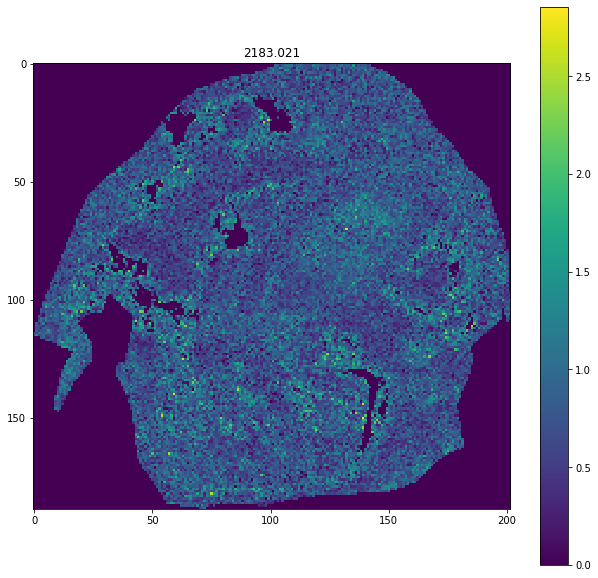

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [18]:
specArray["region_1"].mass_heatmap(2183.020899)

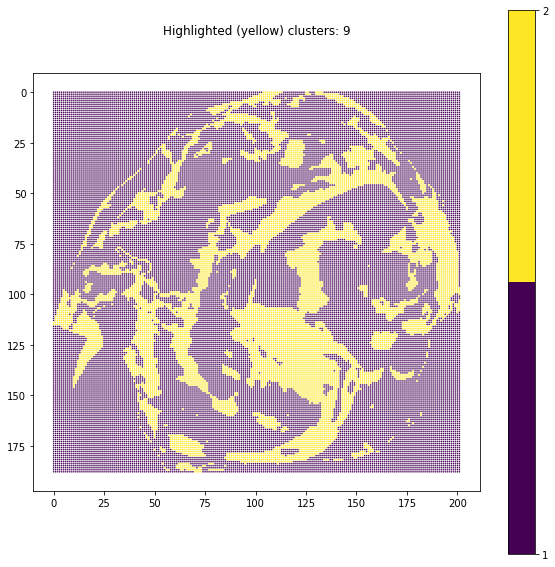

In [15]:
specArray["region_1"].plot_segments(highlight=9, background=None)

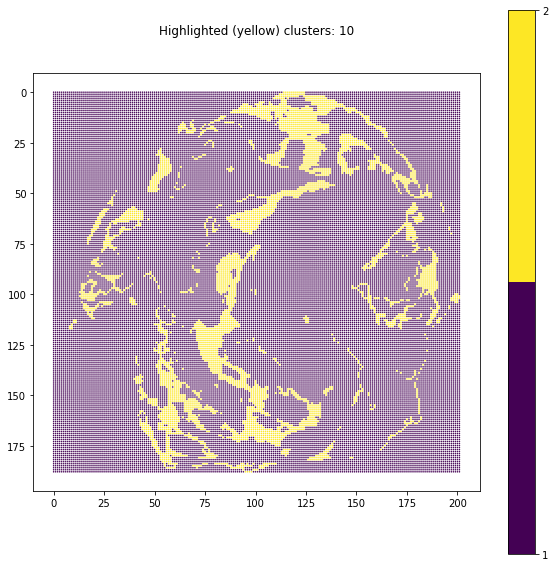

In [19]:
specArray["region_1"].plot_segments(highlight=10, background=None)

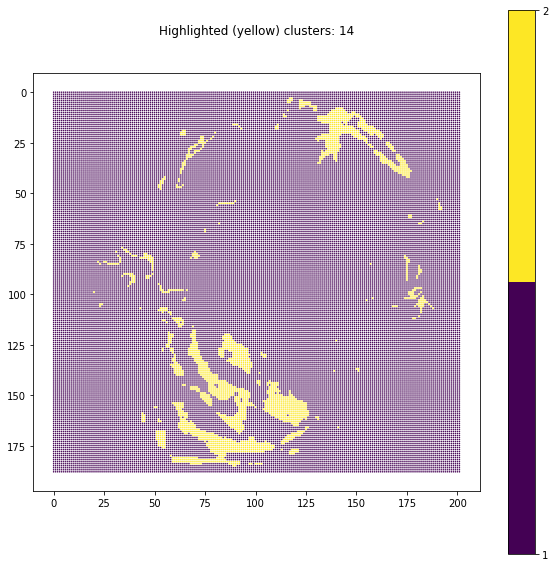

In [20]:
specArray["region_1"].plot_segments(highlight=14, background=None)

In [157]:
help(SpectraRegion.plot_segments)

Help on function plot_segments in module pIMZ.regions:

plot_segments(self, coloring='segmented', highlight=None, file=None)
    Plots the segmented array of the current SpectraRegion object.
    
    Args:
        highlight (list/tuple/set/int, optional): If the highlight clusters are specified, those will be assigned a cluster id 2. Otherwise 1. Background stays 0. Defaults to None.



2022-08-31 13:05:16,333  SpectraRegion  INFO: Processing Mass 2146.0405 with best existing mass 2145.9065296636363
2022-08-31 13:05:16,352  SpectraRegion  INFO: Processing Mass 2182.0365 with best existing mass 2182.0139199999267
2022-08-31 13:05:16,369  SpectraRegion  INFO: Processing Mass 1607.6522 with best existing mass 1605.110848106288
2022-08-31 13:05:16,387  SpectraRegion  INFO: Processing Mass 1417.7354 with best existing mass 1417.3811891865312
2022-08-31 13:05:16,407  SpectraRegion  INFO: Processing Mass 3195.6009 with best existing mass 3197.048765469509
2022-08-31 13:05:16,426  SpectraRegion  INFO: Processing Mass 1390.6616 with best existing mass 1390.2407072073274
2022-08-31 13:05:16,443  SpectraRegion  INFO: Processing Mass 1201.467 with best existing mass 1203.230319011401
2022-08-31 13:05:16,461  SpectraRegion  INFO: Processing Mass 2107.011 with best existing mass 2107.3056674847335
2022-08-31 13:05:16,479  SpectraRegion  INFO: Processing Mass 1373.7303 with best exi

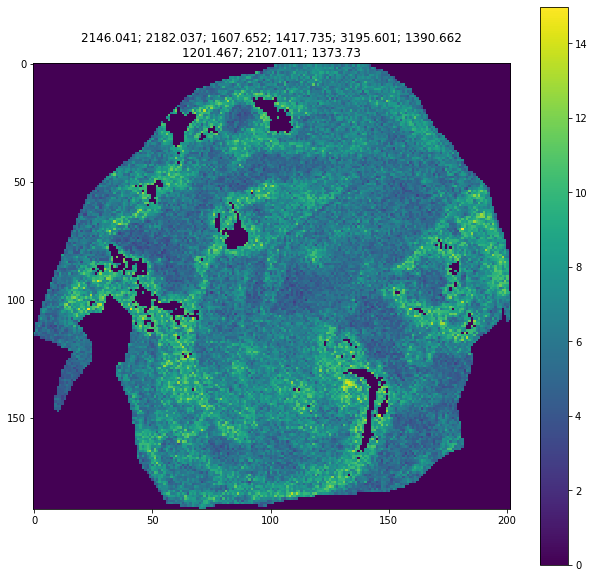

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [141]:
specArray["region_1"].mass_heatmap(pwfile.get_mz_for_protein(["MMP2"]))

2022-08-31 13:19:21,602  SpectraRegion  INFO: Processing Mass 2146.0405 with best existing mass 2145.9065296636363
2022-08-31 13:19:21,617  SpectraRegion  INFO: Processing Mass 2182.0365 with best existing mass 2182.0139199999267
2022-08-31 13:19:21,633  SpectraRegion  INFO: Processing Mass 1607.6522 with best existing mass 1605.110848106288
2022-08-31 13:19:21,649  SpectraRegion  INFO: Processing Mass 1417.7354 with best existing mass 1417.3811891865312
2022-08-31 13:19:21,667  SpectraRegion  INFO: Processing Mass 3195.6009 with best existing mass 3197.048765469509
2022-08-31 13:19:21,682  SpectraRegion  INFO: Processing Mass 1390.6616 with best existing mass 1390.2407072073274
2022-08-31 13:19:21,698  SpectraRegion  INFO: Processing Mass 1201.467 with best existing mass 1203.230319011401
2022-08-31 13:19:21,715  SpectraRegion  INFO: Processing Mass 2107.011 with best existing mass 2107.3056674847335
2022-08-31 13:19:21,730  SpectraRegion  INFO: Processing Mass 1373.7303 with best exi

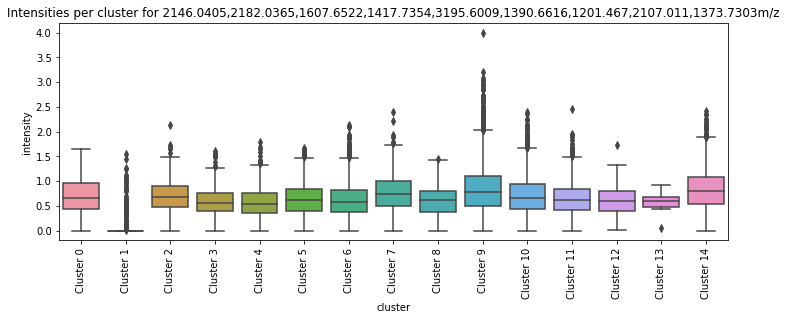

In [143]:
plt.figure(figsize=(12,4))
_ = specArray["region_1"].plot_boxplot(pwfile.get_mz_for_protein("MMP2"))

2022-08-31 11:07:33,299  SpectraRegion  INFO: Processing Mass 1726.955309 with best existing mass 1726.9553087231725


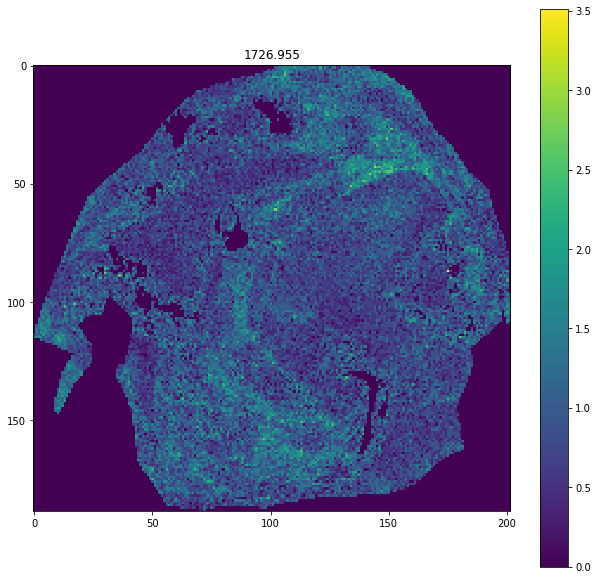

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [99]:
specArray["region_1"].mass_heatmap(1726.955309)

2022-08-31 12:10:25,135  SpectraRegion  INFO: Processing Mass 1726.955309 with best existing mass 1726.9553087231725


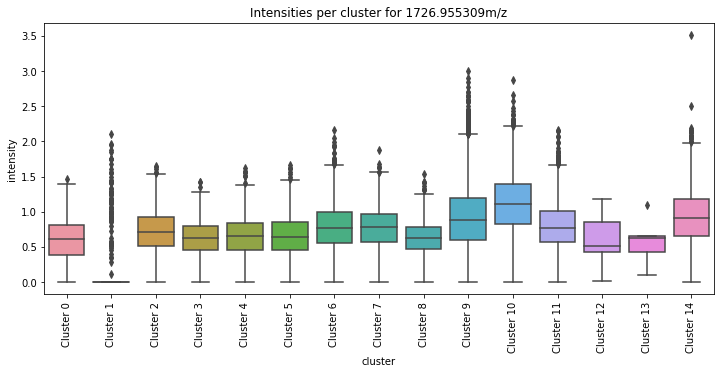

In [103]:
plt.figure(figsize=(12,5))
_ = specArray["region_1"].plot_boxplot(1726.955309)

In [26]:
cdf.head()

NameError: name 'cdf' is not defined

In [24]:
cdf.explode("matches").to_csv("peptideslide_allmarkers.tsv", sep="\t", index=None)

In [27]:
#cdf = pd.read_csv("peptideslide_allmarkers.tsv", sep="\t")

In [216]:
cpred_types = pwfile.get_potential_celltypes(cdf)

2022-08-31 15:56:25,637  ProteinWeights  INFO: Calling analyseMarkers.py
2022-08-31 15:56:26,799  ProteinWeights  INFO: Processing output


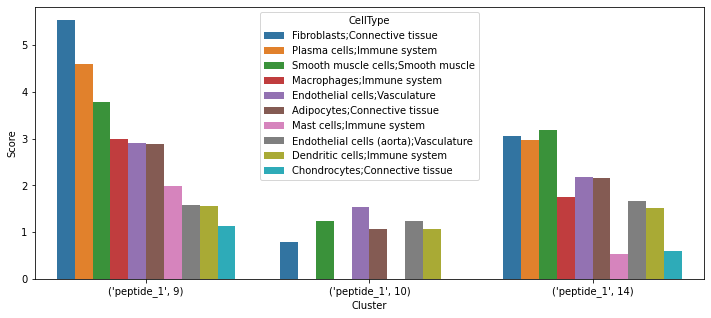

In [221]:
plt.figure(figsize=(12, 5))
ax = sns.barplot(x="Cluster", y="Score", hue="CellType", data=cpred_types)
plt.show()
plt.close()

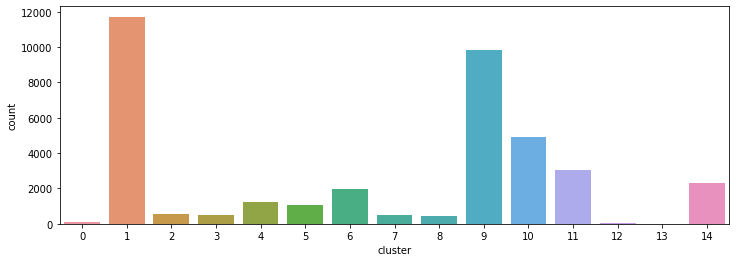

In [226]:
plt.figure(figsize=(12,4))
specArray["region_1"].plot_segment_counts()

In [2]:
plt.rcParams['figure.figsize'] = [10, 10]

specArray = {}
with open("peptide_slide.pickle", "rb") as fin:
    spec = pickle.load(fin)

    specArray["region_1"] = spec

def namefunc(x):
    all_elems = [y.split("|")[-1].split(";") for y in x.strip().replace("_HUMAN", "").split()]

    retElems = set()
    for x in all_elems:
        for y in x:
            retElems.add(y)

    return retElems

pwfile = MaxquantPeptides(filename="PXD003930_peptides.tsv", ppm=5, encoding="ASCII", name_column="Proteins", name_function=namefunc)

2022-09-05 14:09:19,356  SpectraRegion  INFO: Added new Stream Handler
2022-09-05 14:09:19,373  ProteinWeights  INFO: Added new Stream Handler
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:510: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  indf = pd.read_csv(inputfile, sep="\t", encoding=encoding, error_bad_lines=error_bad_lines, warn_bad_lines=warn_bad_lines, dtype="O")
/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:510: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  indf = pd.read_csv(inputfile, sep="\t", encoding=encoding, error_bad_lines=error_bad_lines, warn_bad_lines=warn_bad_lines, dtype="O")
2022-09-05 14:09:20,278  ProteinWeights  ERROR: Unable to process line 3326: Sequence                                   EMQLDGYSIFAIGVADADYSELVSIGSKPSAR
N-term cleavage window         

In [7]:
exprMeanDF = specArray["region_1"].get_mean_expression()
exprMeanDF

|##########################################################| 100% Time: 0:00:00


,mass,mean.0,mean.1,mean.2,mean.3,mean.4,mean.5,mean.6,mean.7,mean.8,mean.9,mean.10,mean.11,mean.12,mean.13,mean.14
0,533.109761,0.556911,0.004275,0.879514,0.609732,0.733894,0.652231,0.839412,0.525979,0.714983,0.554617,0.661078,0.801637,0.537044,0.717402,0.692198
1,582.116073,1.038445,0.003513,1.079299,1.077093,1.023454,0.897787,0.988598,0.868099,1.067641,0.508400,0.486762,0.946854,1.243690,1.198721,0.378594
2,595.158849,0.628940,0.004072,1.138926,0.713083,0.822807,0.738775,0.949931,0.638995,0.851985,0.614748,0.543528,1.069059,0.627479,0.550441,0.397511
3,600.721209,1.035477,0.002424,0.486510,0.964616,0.924971,0.724274,0.655819,0.493224,0.725484,0.661411,0.584507,0.477307,0.765303,0.755957,0.860084
4,607.194646,41.119133,0.011100,22.976053,62.996620,58.562527,47.273350,32.358349,22.897861,49.398762,4.024556,6.627365,15.684860,49.804886,38.445522,13.096289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,3198.535258,0.645427,0.004541,0.614788,0.538177,0.533133,0.567779,0.582050,0.652717,0.535048,0.736214,0.667183,0.605226,0.506103,0.462203,0.690842
7996,3199.925848,0.590051,0.004005,0.603226,0.532286,0.514228,0.575757,0.557712,0.666735,0.550959,0.723721,0.654600,0.582226,0.500784,0.571687,0.696905
7997,3201.268487,0.578060,0.004594,0.626876,0.527249,0.524474,0.572617,0.576589,0.686273,0.545054,0.736114,0.643933,0.615274,0.474099,0.453908,0.666284
7998,3213.496089,0.572859,0.004478,0.616708,0.505470,0.517837,0.585551,0.580450,0.655055,0.550839,0.733740,0.653979,0.595093,0.513951,0.348333,0.691539


In [8]:
pwfile.annotate_df(exprMeanDF, mass_column="mass", add_matches=False)

,mass,mean.0,mean.1,mean.2,mean.3,mean.4,mean.5,mean.6,mean.7,mean.8,mean.9,mean.10,mean.11,mean.12,mean.13,mean.14,matches
0,533.109761,0.556911,0.004275,0.879514,0.609732,0.733894,0.652231,0.839412,0.525979,0.714983,0.554617,0.661078,0.801637,0.537044,0.717402,0.692198,[]
1,582.116073,1.038445,0.003513,1.079299,1.077093,1.023454,0.897787,0.988598,0.868099,1.067641,0.508400,0.486762,0.946854,1.243690,1.198721,0.378594,[]
2,595.158849,0.628940,0.004072,1.138926,0.713083,0.822807,0.738775,0.949931,0.638995,0.851985,0.614748,0.543528,1.069059,0.627479,0.550441,0.397511,[]
3,600.721209,1.035477,0.002424,0.486510,0.964616,0.924971,0.724274,0.655819,0.493224,0.725484,0.661411,0.584507,0.477307,0.765303,0.755957,0.860084,[]
4,607.194646,41.119133,0.011100,22.976053,62.996620,58.562527,47.273350,32.358349,22.897861,49.398762,4.024556,6.627365,15.684860,49.804886,38.445522,13.096289,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,3198.535258,0.645427,0.004541,0.614788,0.538177,0.533133,0.567779,0.582050,0.652717,0.535048,0.736214,0.667183,0.605226,0.506103,0.462203,0.690842,[]
7996,3199.925848,0.590051,0.004005,0.603226,0.532286,0.514228,0.575757,0.557712,0.666735,0.550959,0.723721,0.654600,0.582226,0.500784,0.571687,0.696905,[]
7997,3201.268487,0.578060,0.004594,0.626876,0.527249,0.524474,0.572617,0.576589,0.686273,0.545054,0.736114,0.643933,0.615274,0.474099,0.453908,0.666284,[]
7998,3213.496089,0.572859,0.004478,0.616708,0.505470,0.517837,0.585551,0.580450,0.655055,0.550839,0.733740,0.653979,0.595093,0.513951,0.348333,0.691539,[]


In [34]:
exprCounts= exprMeanDF.copy()
pwfile.annotate_df(exprCounts, mass_column="mass", add_matches=True)

,mass,mean.0,mean.1,mean.2,mean.3,mean.4,mean.5,mean.6,mean.7,mean.8,mean.9,mean.10,mean.11,mean.12,mean.13,mean.14,matches,#matches
0,533.109761,0.556911,0.004275,0.879514,0.609732,0.733894,0.652231,0.839412,0.525979,0.714983,0.554617,0.661078,0.801637,0.537044,0.717402,0.692198,[],0
1,582.116073,1.038445,0.003513,1.079299,1.077093,1.023454,0.897787,0.988598,0.868099,1.067641,0.508400,0.486762,0.946854,1.243690,1.198721,0.378594,[],0
2,595.158849,0.628940,0.004072,1.138926,0.713083,0.822807,0.738775,0.949931,0.638995,0.851985,0.614748,0.543528,1.069059,0.627479,0.550441,0.397511,[],0
3,600.721209,1.035477,0.002424,0.486510,0.964616,0.924971,0.724274,0.655819,0.493224,0.725484,0.661411,0.584507,0.477307,0.765303,0.755957,0.860084,[],0
4,607.194646,41.119133,0.011100,22.976053,62.996620,58.562527,47.273350,32.358349,22.897861,49.398762,4.024556,6.627365,15.684860,49.804886,38.445522,13.096289,[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,3198.535258,0.645427,0.004541,0.614788,0.538177,0.533133,0.567779,0.582050,0.652717,0.535048,0.736214,0.667183,0.605226,0.506103,0.462203,0.690842,[],0
7996,3199.925848,0.590051,0.004005,0.603226,0.532286,0.514228,0.575757,0.557712,0.666735,0.550959,0.723721,0.654600,0.582226,0.500784,0.571687,0.696905,[],0
7997,3201.268487,0.578060,0.004594,0.626876,0.527249,0.524474,0.572617,0.576589,0.686273,0.545054,0.736114,0.643933,0.615274,0.474099,0.453908,0.666284,[],0
7998,3213.496089,0.572859,0.004478,0.616708,0.505470,0.517837,0.585551,0.580450,0.655055,0.550839,0.733740,0.653979,0.595093,0.513951,0.348333,0.691539,[],0


Text(0, 0.5, 'frequency')

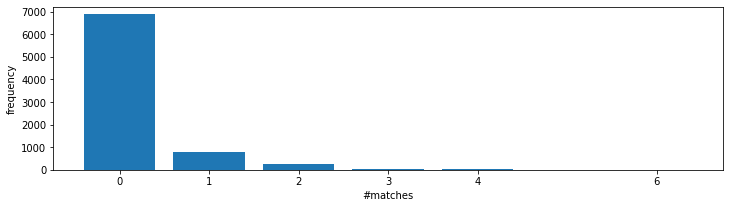

In [36]:
plt.figure(figsize=(12, 3))

labels, counts = np.unique(exprCounts['#matches'], return_counts=True)
plt.bar(labels, counts, align='center')
plt.gca().set_xticks(labels)

plt.xlabel('#matches')
plt.ylabel('frequency')

In [9]:
protMeanDF = exprMeanDF.explode("matches").dropna(axis=0)
protMeanDF

,mass,mean.0,mean.1,mean.2,mean.3,mean.4,mean.5,mean.6,mean.7,mean.8,mean.9,mean.10,mean.11,mean.12,mean.13,mean.14,matches
668,1726.955309,0.601994,0.007587,0.740083,0.635235,0.665940,0.659004,0.786967,0.795223,0.628322,0.916012,1.107449,0.795930,0.606342,0.576610,0.925017,ANXA5
668,1726.955309,0.601994,0.007587,0.740083,0.635235,0.665940,0.659004,0.786967,0.795223,0.628322,0.916012,1.107449,0.795930,0.606342,0.576610,0.925017,MYH9
690,1747.910062,0.655192,0.008741,0.834062,0.678001,0.721909,0.670062,0.888606,0.847042,0.677454,0.968344,1.056631,0.927318,0.641504,0.550861,0.903599,KV121
690,1747.910062,0.655192,0.008741,0.834062,0.678001,0.721909,0.670062,0.888606,0.847042,0.677454,0.968344,1.056631,0.927318,0.641504,0.550861,0.903599,IGHG1
721,1764.980754,0.631856,0.008208,0.698313,0.623693,0.632842,0.636630,0.781394,0.775043,0.627161,0.900016,1.057624,0.771141,0.603109,0.531869,0.927121,KPYM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7987,3175.470644,0.572852,0.004041,0.632016,0.551493,0.521898,0.563437,0.593718,0.664214,0.571014,0.719178,0.647318,0.604296,0.544032,0.494751,0.681622,VTDB
7987,3175.470644,0.572852,0.004041,0.632016,0.551493,0.521898,0.563437,0.593718,0.664214,0.571014,0.719178,0.647318,0.604296,0.544032,0.494751,0.681622,CON__ENSEMBL:ENSBTAP00000018229
7987,3175.470644,0.572852,0.004041,0.632016,0.551493,0.521898,0.563437,0.593718,0.664214,0.571014,0.719178,0.647318,0.604296,0.544032,0.494751,0.681622,MYH10
7992,3187.698246,0.559148,0.004327,0.612097,0.557163,0.521170,0.565335,0.589336,0.630223,0.517958,0.724674,0.644539,0.593890,0.572572,0.497249,0.686575,FINC


In [4]:
ppiA = PPIAnalysis(load_shao=True)

Loading gene information


/usr/local/hdd2/data/plaque_ims/pimz/pIMZ/annotations.py:943: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  uniprotDF = pd.read_csv(path, sep="\t", header=0)


Loading LR (human)
sorted out 0 of 3398 PPIs for no consensus direction
sorted out 0 of 3398 PPIs for no protein info
Total Interactions 3398
Combining PPI
Inserted new entries 3398 of 3398 (incompatible entries not inserted 0)


In [21]:
nghs = ppiA.get_neighbouring_clusters(spec, "segmented")
print(list(nghs)[:5])

[('mean.4', 'mean.0'), ('mean.4', 'mean.9'), ('mean.8', 'mean.0'), ('mean.14', 'mean.13'), ('mean.5', 'mean.10')]


In [22]:
("mean.4", "mean.9") in nghs

True

Selected sources: None
Selected targets: None
Contained Ligs 143
Contained Recs 13
total com scores 13193
mean score calculated 1.9863969460270083
mean score taken 0.3520197119541534
               score  count
clusterI                   
mean.0    352.282054   1027
mean.1      1.989982    711
mean.10   460.311635   1106
mean.11   335.860736    869
mean.12   201.586061    632
mean.13    77.198691    316
mean.14   385.114711    948
mean.2    326.982378    869
mean.3    330.775981   1027
mean.4    275.923090    790
mean.5    359.416843    948
mean.6    381.254700   1027
mean.7    436.095686   1106
mean.8    303.032202    869
mean.9    416.371308    948
TargetScore for 0 Elements: 0
ppi_analysis/chord_plot.peptideslide.png


score  count    experiment
clusterI clusterJ                                
mean.0   mean.0    24.171047     79  peptideslide
         mean.10   31.213385     79  peptideslide
         mean.12   21.446190     79  peptideslide
         mean.13   16.388540     79  peptideslide
         mean.14   32.801559     79  peptideslide
...                      ...    ...           ...
mean.9   mean.4    32.238900     79  peptideslide
         mean.5    34.225404     79  peptideslide
         mean.6    37.943293     79  peptideslide
         mean.7    41.074525     79  peptideslide
         mean.9    44.037294     79  peptideslide

[167 rows x 3 columns]

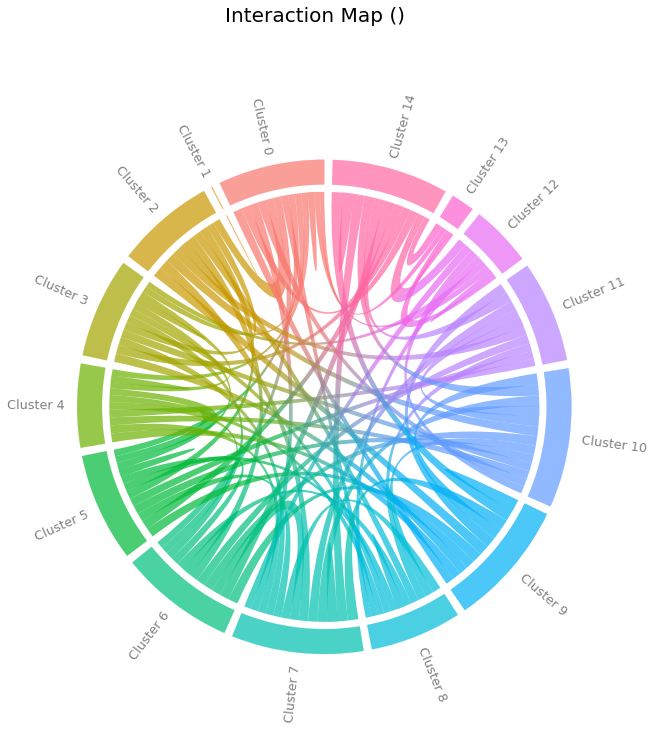

In [25]:
ppiA.analyse(protMeanDF, outputName="peptideslide", outputFolder="ppi_analysis", index_col="matches", min_comm=0, neighbours=nghs, selfCommunication=True)

In [ ]:
fa = FlowAnalysis()

In [280]:
from collections import OrderedDict

In [323]:
protMeanSmallDF = protMeanDF[["mass", "mean.9", "mean.10", "mean.14", "mean.8", "mean.7", "matches"]]

In [302]:
protMeanSmallDF

,mass,mean.9,mean.10,mean.14,matches
668,1726.955309,0.916012,1.107449,0.925017,ANXA5
668,1726.955309,0.916012,1.107449,0.925017,MYH9
690,1747.910062,0.968344,1.056631,0.903599,KV121
690,1747.910062,0.968344,1.056631,0.903599,IGHG1
721,1764.980754,0.900016,1.057624,0.927121,KPYM
...,...,...,...,...,...
7987,3175.470644,0.719178,0.647318,0.681622,CON__Q3MHN5
7987,3175.470644,0.719178,0.647318,0.681622,VTDB
7987,3175.470644,0.719178,0.647318,0.681622,MYH10
7992,3187.698246,0.724674,0.644539,0.686575,FINC


1 4
1 5
1 4
       mean.9  bins.9   mean.10  bins.10   mean.14  bins.14 matches
668  0.916012       3  1.107449        4  0.925017        3   ANXA5
668  0.916012       3  1.107449        4  0.925017        3    MYH9
690  0.968344       3  1.056631        4  0.903599        3   KV121
690  0.968344       3  1.056631        4  0.903599        3   IGHG1
721  0.900016       3  1.057624        4  0.927121        3    KPYM
61.92457790602323


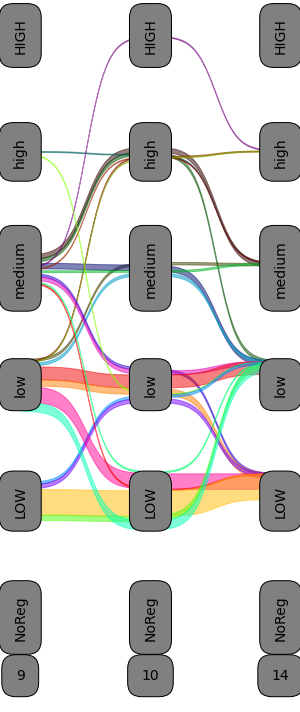

12
[('9', 3), ('10', 4), ('14', 3)] 24
6
[('9', 2), ('10', 3), ('14', 3)] 7
21
[('9', 3), ('10', 4), ('14', 2)] 11
10
[('9', 4), ('10', 4), ('14', 3)] 1
5
[('9', 3), ('10', 3), ('14', 2)] 35
16
[('9', 3), ('10', 5), ('14', 4)] 1
22
[('9', 2), ('10', 4), ('14', 3)] 1
4
[('9', 3), ('10', 4), ('14', 4)] 1
15
[('9', 2), ('10', 4), ('14', 4)] 1
20
[('9', 3), ('10', 3), ('14', 3)] 4
13
[('9', 2), ('10', 3), ('14', 2)] 9
1
[('9', 3), ('10', 2), ('14', 1)] 7
19
[('9', 3), ('10', 2), ('14', 2)] 17
0
[('9', 2), ('10', 2), ('14', 2)] 151
8
[('9', 2), ('10', 2), ('14', 1)] 42
17
[('9', 4), ('10', 2), ('14', 2)] 1
3
[('9', 3), ('10', 1), ('14', 2)] 2
2
[('9', 1), ('10', 2), ('14', 2)] 8
11
[('9', 1), ('10', 2), ('14', 1)] 17
18
[('9', 2), ('10', 1), ('14', 1)] 183
9
[('9', 3), ('10', 1), ('14', 1)] 2
23
[('9', 1), ('10', 1), ('14', 1)] 395
14
[('9', 1), ('10', 1), ('14', 2)] 29
7
[('9', 2), ('10', 1), ('14', 2)] 69


In [327]:
seriesOrder = ["9", "10", "14"]
series2name = OrderedDict([(x,x) for x in seriesOrder])
levelOrder = OrderedDict([(0, 'NoReg'), (1, 'LOW'), (2, 'low'), (3, "medium"), (4, 'high'), (5, 'HIGH')])

faRes = fa.analyse_flows(protMeanDF, seriesOrder, series2name, levelOrder, "matches")

In [316]:
faRes[0].loc[lambda x: x["flowgroupid"] == 13]

,mean.9,bins.9,mean.10,bins.10,mean.14,bins.14,matches,flowgroups,flowgroupid
984,0.870696,2,0.965217,3,0.845919,2,PLEC,"(2, 3, 2)",13
984,0.870696,2,0.965217,3,0.845919,2,DESM,"(2, 3, 2)",13
1074,0.880213,2,0.922319,3,0.806065,2,LEG1,"(2, 3, 2)",13
1098,0.862885,2,0.896621,3,0.830652,2,PRDX1,"(2, 3, 2)",13
1098,0.862885,2,0.896621,3,0.830652,2,VINC,"(2, 3, 2)",13
1170,0.841163,2,0.886186,3,0.770367,2,APOC3,"(2, 3, 2)",13
1242,0.863679,2,0.885916,3,0.796982,2,MYH11,"(2, 3, 2)",13
1312,0.872004,2,0.904291,3,0.854837,2,URP2,"(2, 3, 2)",13
1325,0.866396,2,0.888687,3,0.814242,2,A2MG,"(2, 3, 2)",13


In [321]:
faRes[1].loc[lambda x: x["adj_pval"] < 0.05].to_csv("test2.tsv", sep="\t")

In [328]:
faRes[0].to_csv("test1.tsv", sep="\t")
faRes[1].to_csv("test2.tsv", sep="\t")

In [104]:
df.loc[lambda x: x["p_value_adj"] < 0.05]

,feature,pct.1,pct.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
0,2736.331891,0.914088,0.609466,0.737005,0.763704,-0.051340,1.329079e-04,2.441477e-04,0,[]
1,2614.007917,0.907900,0.601902,0.738449,0.755431,-0.032802,1.729383e-02,2.318596e-02,0,[]
2,2661.192076,0.899527,0.598403,0.711706,0.738347,-0.053017,1.451474e-04,2.650489e-04,0,[]
5,533.109761,0.939570,0.620502,0.807095,0.690423,0.225259,7.653214e-34,5.571038e-33,0,[]
6,582.116073,0.709137,0.609692,0.409665,0.759679,-0.890944,0.000000e+00,0.000000e+00,0,[]
...,...,...,...,...,...,...,...,...,...,...
7994,2440.088256,0.905715,0.614490,0.748911,0.803668,-0.101806,1.088278e-13,5.431208e-13,0,[]
7995,2645.320169,0.929742,0.613192,0.760303,0.780215,-0.037297,5.554199e-03,8.005478e-03,0,[]
7996,2400.048852,0.899527,0.608281,0.748740,0.787209,-0.072281,1.149023e-07,3.243538e-07,0,[]
7997,2400.576317,0.927921,0.593520,0.797096,0.758896,0.070851,2.832811e-07,7.549130e-07,0,[]


In [105]:
df.sort_values(by=["log2FC"], ascending=False).head(50)

,feature,pct.1,pct.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
90,856.206170,1.000000,0.660128,19.572973,12.470724,0.650318,2.323677e-176,4.694297e-175,0,[]
709,1760.185616,0.997816,0.617990,1.214273,0.777037,0.644038,0.000000e+00,0.000000e+00,0,[]
85,855.199191,1.000000,0.656403,44.768531,28.878379,0.632495,2.570702e-172,5.077929e-171,0,[]
541,1560.084501,0.998180,0.629844,1.253808,0.818316,0.615587,0.000000e+00,0.000000e+00,0,[]
702,1762.199574,0.994904,0.620022,1.181482,0.783225,0.593099,0.000000e+00,0.000000e+00,0,[]
520,1524.120965,0.994904,0.621461,1.193380,0.795997,0.584218,0.000000e+00,0.000000e+00,0,[]
600,1660.206986,0.995268,0.619881,1.180021,0.787788,0.582934,0.000000e+00,0.000000e+00,0,[]
2492,1994.284261,0.996360,0.620897,1.146485,0.766927,0.580056,0.000000e+00,0.000000e+00,0,[]
2273,1723.167150,0.997088,0.637295,1.261670,0.846185,0.576289,0.000000e+00,0.000000e+00,0,[]
609,1668.166915,0.995268,0.623522,1.195009,0.801755,0.575789,0.000000e+00,0.000000e+00,0,[]


In [106]:
df.sort_values(by=["#matches", "log2FC"], ascending=False).head(50)

,feature,pct.1,pct.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
3451,2474.229639,0.934110,0.616579,0.798422,0.814876,-0.029428,2.629600e-02,3.439072e-02,6,"[PLEC, NUCL, CAH2, TWF2, CO6A3, CATA]"
785,1841.990673,0.991991,0.649657,1.025315,0.945670,0.116659,5.690098e-25,3.765160e-24,4,"[TRFL, CO3, ANK1, PYGB]"
1223,2278.204391,0.981798,0.644012,0.841840,0.809201,0.057048,4.781108e-07,1.237427e-06,4,"[UBA1, CON__Q04695, K1C17, CON__Q9QWL7]"
1000,2055.086613,0.975974,0.641726,0.827086,0.809077,0.031760,5.736088e-03,8.254849e-03,4,"[ALBU, CON__P02768-1, IQGA1, VATA]"
1087,2140.104412,0.905715,0.599249,0.801031,0.791351,0.017541,2.290487e-01,2.591048e-01,4,"[TLN1, CO4A, NIBAN, CAH2]"
987,2047.078732,0.972333,0.640513,0.833130,0.824109,0.015708,1.891253e-01,2.167004e-01,4,"[ARF3, CON__P13647, K2C5, QSOX1]"
2907,2349.220388,0.906807,0.581750,0.752903,0.745254,0.014733,3.066264e-01,3.399406e-01,4,"[K2C1, FLNB, CO3, COCA1]"
1106,2157.079202,0.912632,0.608083,0.823835,0.816406,0.013069,3.375317e-01,3.720383e-01,4,"[41, CO3, ANXA6, ITIH1]"
1211,2265.113664,0.896614,0.597020,0.776464,0.782610,-0.011374,4.158224e-01,4.510616e-01,4,"[ENPL, HSP71, PPT1, THRB]"
6139,2566.248341,0.921369,0.614942,0.778568,0.791716,-0.024162,7.360321e-02,9.010339e-02,4,"[CD109, CO6A3, CON__P35908, K22E]"


In [107]:
df.sort_values(by=["#matches", "log2FC"], ascending=False).loc[lambda x: x["#matches"] == 1].loc[lambda x: x["p_value_adj"] < 0.05]

,feature,pct.1,pct.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
2400,1910.129586,0.995996,0.635037,1.060408,0.803407,0.400417,3.206880e-244,1.101075e-242,1,[PGS1]
851,1908.115628,0.995632,0.644295,1.123352,0.866094,0.375215,5.068184e-217,1.365167e-215,1,[A2MG]
2296,1766.035685,0.996724,0.645226,1.115617,0.869235,0.360024,4.307581e-206,1.070206e-204,1,[LIMC1]
788,1844.052583,0.990899,0.641811,1.114389,0.885791,0.331214,1.062766e-161,1.945567e-160,1,[ALDH2]
850,1907.060698,0.993811,0.648895,1.094720,0.903066,0.277659,7.967141e-126,1.167347e-124,1,[PRDX1]
...,...,...,...,...,...,...,...,...,...,...
948,2008.861481,0.953040,0.651351,0.749413,0.917399,-0.291788,1.020428e-138,1.606974e-137,1,[FBLI1]
2598,2100.736328,0.943939,0.648161,0.733061,0.901801,-0.298876,1.081270e-139,1.706146e-138,1,[SPRL1]
2542,2032.885123,0.957044,0.652367,0.759891,0.942518,-0.310727,4.701813e-151,7.952326e-150,1,[TRFL]
2601,2102.894140,0.941027,0.649290,0.724073,0.906579,-0.324298,5.175710e-165,9.765490e-164,1,[ASPH]


In [110]:
df.sort_values(by=["#matches", "log2FC"], ascending=False).loc[lambda x: x["feature"] < 886].loc[lambda x: x["feature"] >855]

,feature,pct.1,pct.2,mean.1,mean.2,log2FC,p_value,p_value_adj,#matches,matches
90,856.206170,1.000000,0.660128,19.572973,12.470724,0.650318,2.323677e-176,4.694297e-175,0,[]
85,855.199191,1.000000,0.656403,44.768531,28.878379,0.632495,2.570702e-172,5.077929e-171,0,[]
86,855.343046,1.000000,0.658463,17.754382,13.202012,0.427417,7.864101e-55,6.913496e-54,0,[]
87,855.390997,1.000000,0.660269,13.604897,11.358201,0.260392,3.679240e-25,2.438601e-24,0,[]
94,881.188840,0.923189,0.626316,0.715015,0.760344,-0.088679,5.405944e-10,2.022804e-09,0,[]
84,855.151240,0.999636,0.641585,38.952802,41.549893,-0.093118,6.436558e-05,1.235424e-04,0,[]
91,865.988252,0.887878,0.599814,0.588309,0.772151,-0.392308,3.652799e-189,8.139943e-188,0,[]
95,882.147868,0.824900,0.611583,0.567989,0.769982,-0.438963,7.338434e-230,2.223768e-228,0,[]
96,882.195819,0.852202,0.626316,0.574954,0.839776,-0.546557,0.000000e+00,0.000000e+00,0,[]
92,869.200995,0.781580,0.624764,0.512710,0.773258,-0.592807,0.000000e+00,0.000000e+00,0,[]


Text(0, 0.5, 'frequency')

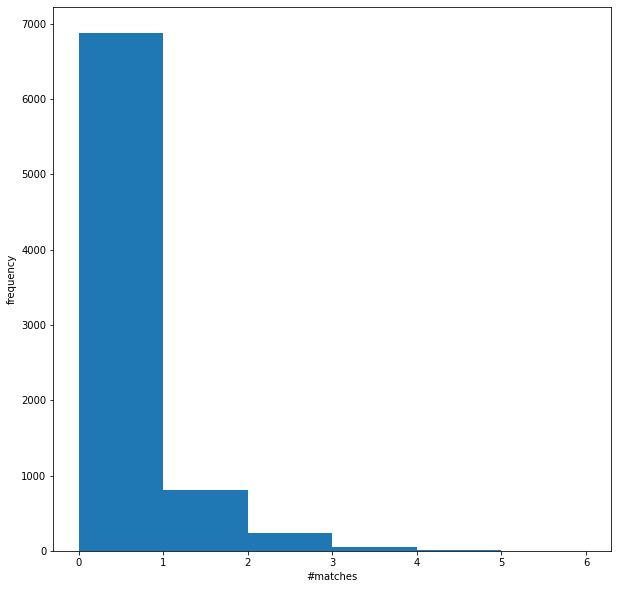

In [108]:
all_matches = list(df['#matches'])
plt.hist(all_matches, bins=df['#matches'].max())
plt.xlabel('#matches')
plt.ylabel('frequency')

Text(0, 0.5, 'frequency')

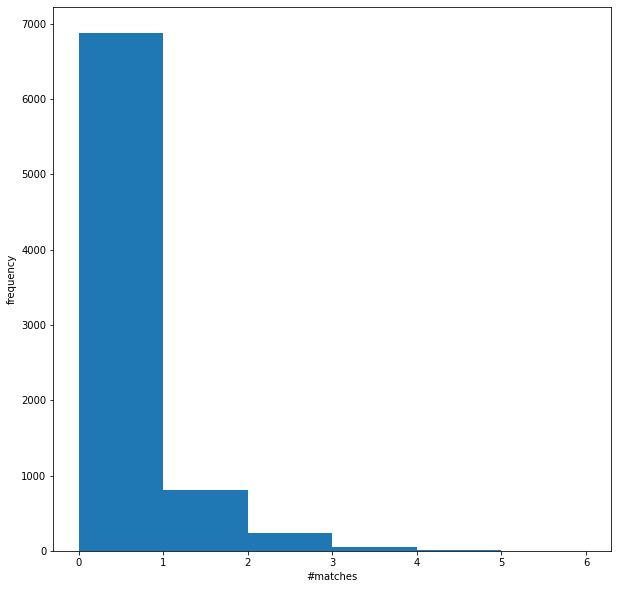

In [112]:
all_matches = list(df['#matches'])
plt.hist(all_matches, bins=df['#matches'].max())
plt.xlabel('#matches')
plt.ylabel('frequency')

2022-08-30 23:58:19,887  SpectraRegion  INFO: Processing Mass 1844.9636588129606 with best existing mass 1844.9636588129606


[('CLIC1', 1844.968), ('MK01', 1844.9713)]


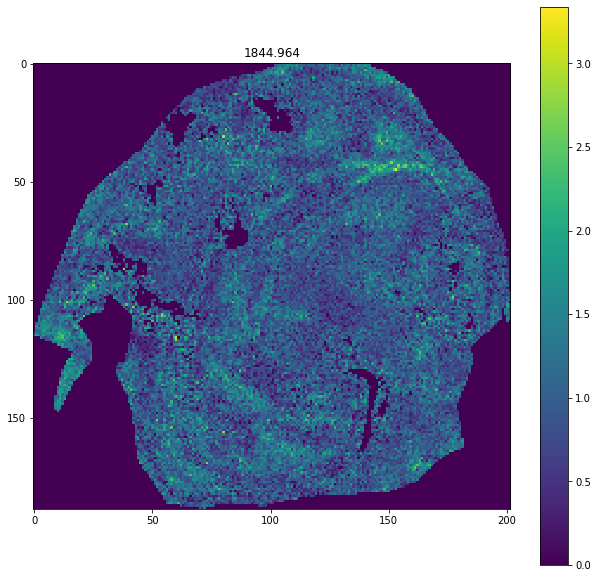

2022-08-30 23:58:20,048  SpectraRegion  INFO: Processing Mass 1898.0937896132396 with best existing mass 1898.0937896132396


[('ANGT', 1898.0826)]


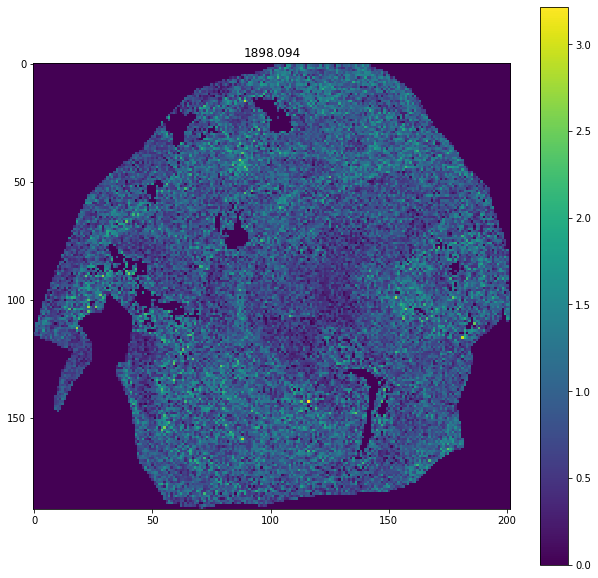

2022-08-30 23:58:20,219  SpectraRegion  INFO: Processing Mass 1860.9314688819977 with best existing mass 1860.9314688819977


[('RNAS4', 1860.9431)]


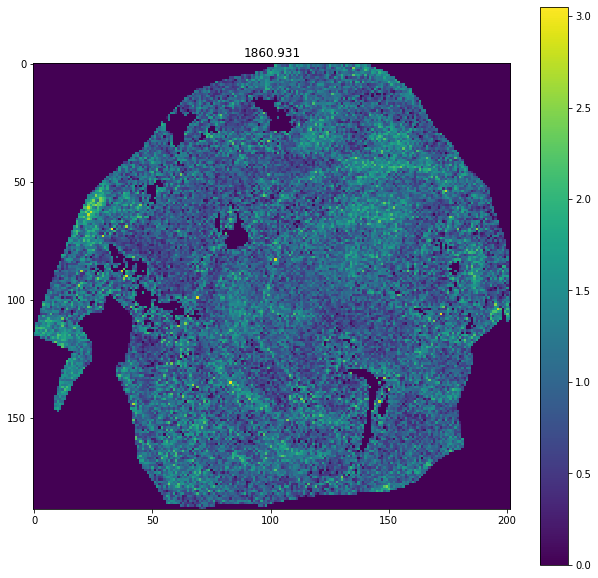

2022-08-30 23:58:20,416  SpectraRegion  INFO: Processing Mass 1841.9906731544615 with best existing mass 1841.9906731544615


[('TRFL', 1841.9908), ('CO3', 1841.9836), ('ANK1', 1842.0047), ('PYGB', 1841.9757)]


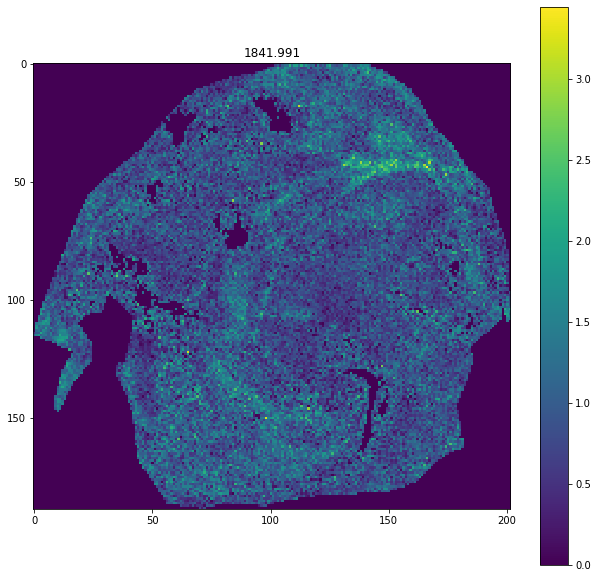

2022-08-30 23:58:20,591  SpectraRegion  INFO: Processing Mass 1794.902416434359 with best existing mass 1794.902416434359


[('MMP9', 1794.906), ('SPTA1', 1794.8982), ('TENS1', 1794.8948), ('TPM2', 1794.8935)]


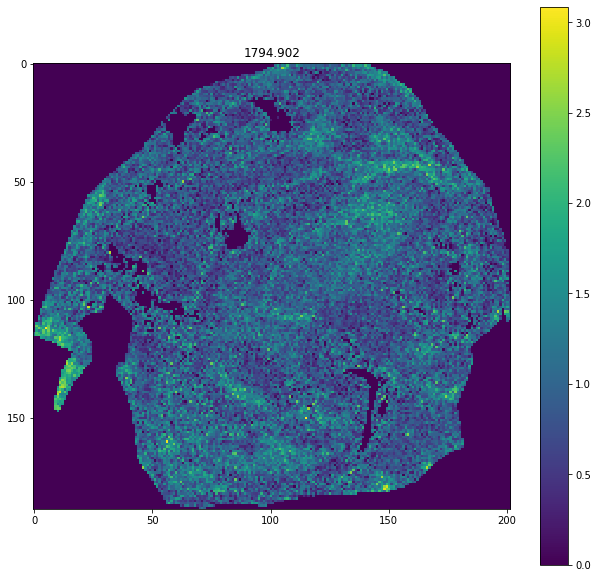

2022-08-30 23:58:20,777  SpectraRegion  INFO: Processing Mass 2049.859912341472 with best existing mass 2049.859912341472


[('GAS6', 2049.8577)]


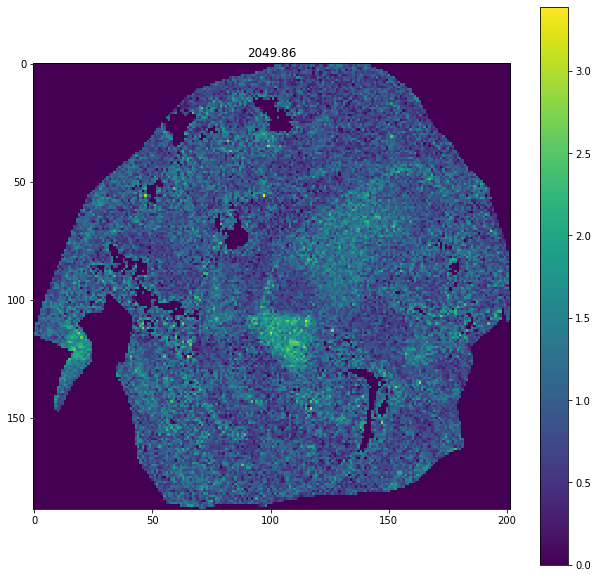

2022-08-30 23:58:20,941  SpectraRegion  INFO: Processing Mass 1849.9985538797741 with best existing mass 1849.9985538797741


[('ACADV', 1850.0058), ('VPLEMEHVIGLNNTKR_1849.988', 1849.988)]


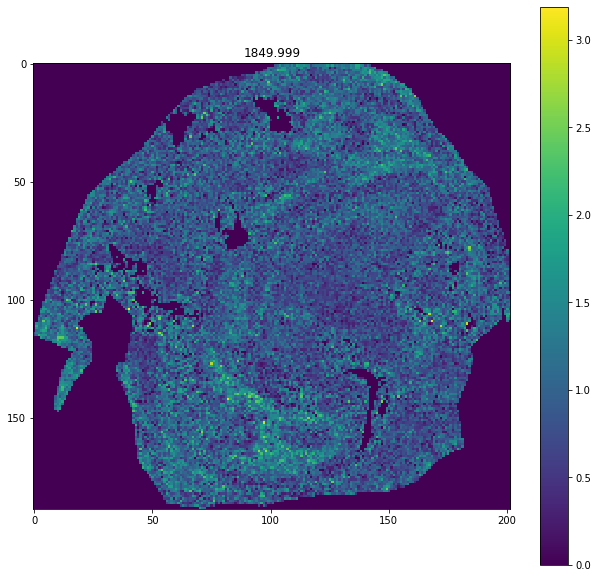

2022-08-30 23:58:21,123  SpectraRegion  INFO: Processing Mass 1864.9114335538598 with best existing mass 1864.9114335538598


[('NGAL', 1864.9189), ('TBA4A', 1864.8971)]


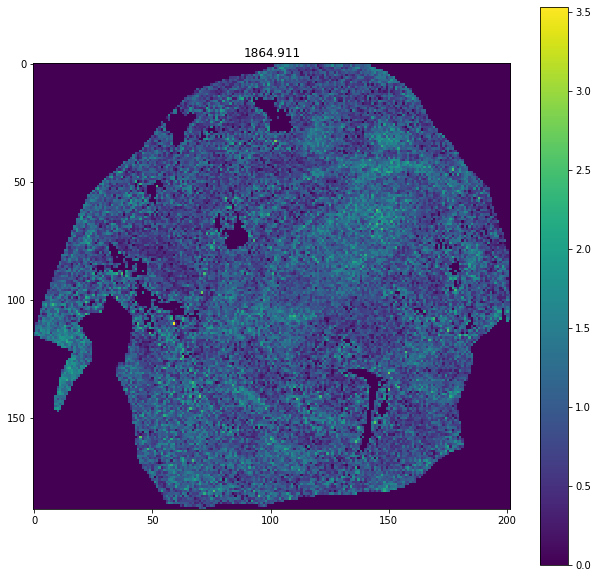

2022-08-30 23:58:21,332  SpectraRegion  INFO: Processing Mass 1780.037488141862 with best existing mass 1780.037488141862


[('ALBU', 1780.0519), ('CON__P02768-1', 1780.0519)]


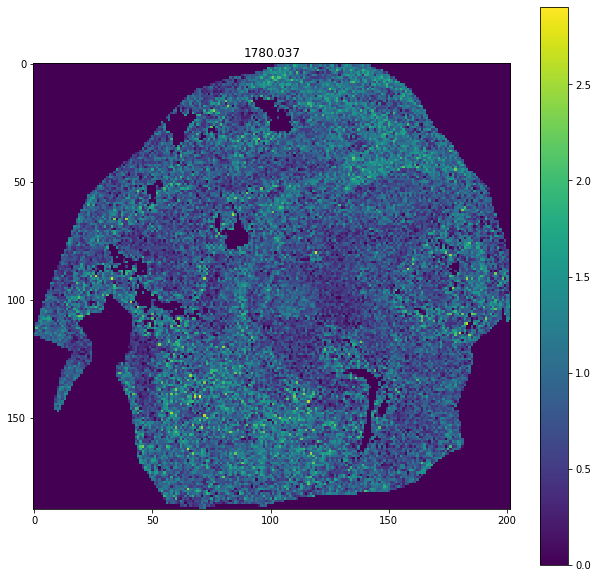

2022-08-30 23:58:21,515  SpectraRegion  INFO: Processing Mass 1773.995614061686 with best existing mass 1773.995614061686


[('MUCB', 1774.005)]


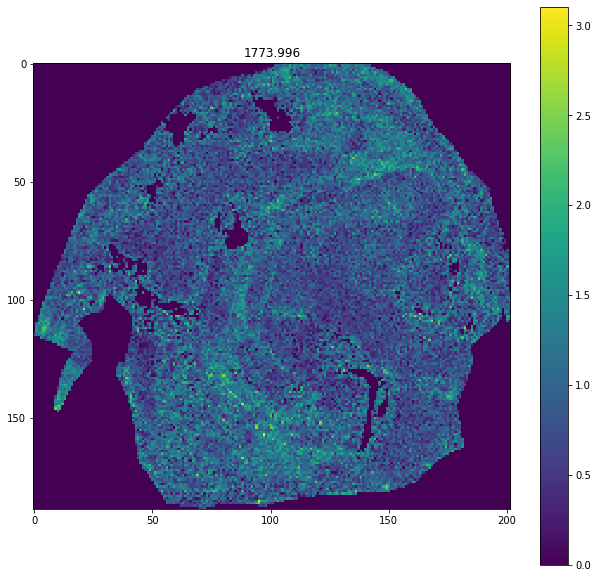

2022-08-30 23:58:21,694  SpectraRegion  INFO: Processing Mass 2087.981260704488 with best existing mass 2087.981260704488


[('PLEC', 2087.992)]


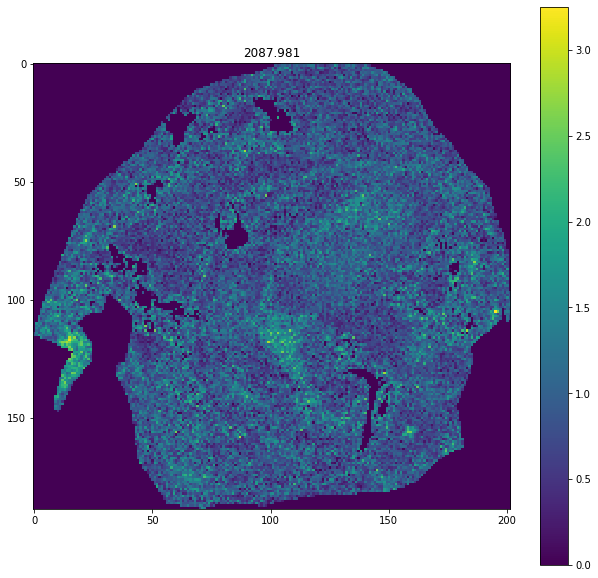

2022-08-30 23:58:21,869  SpectraRegion  INFO: Processing Mass 1828.03682111215 with best existing mass 1828.03682111215


[('NIBAN', 1828.0506)]


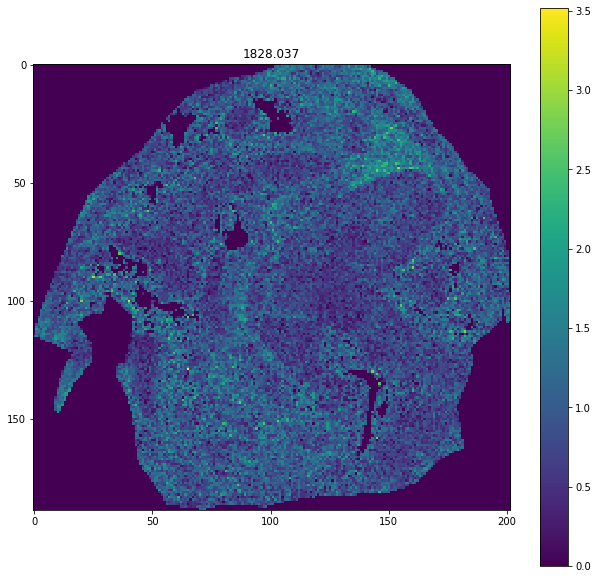

2022-08-30 23:58:22,044  SpectraRegion  INFO: Processing Mass 1907.0606979703261 with best existing mass 1907.0606979703261


[('PRDX1', 1907.0459)]


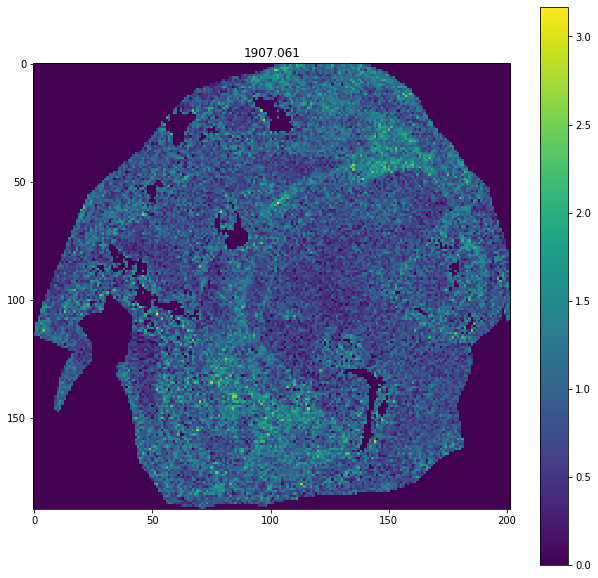

2022-08-30 23:58:22,225  SpectraRegion  INFO: Processing Mass 1809.9591502532103 with best existing mass 1809.9591502532103


[('ITIH5', 1809.9533)]


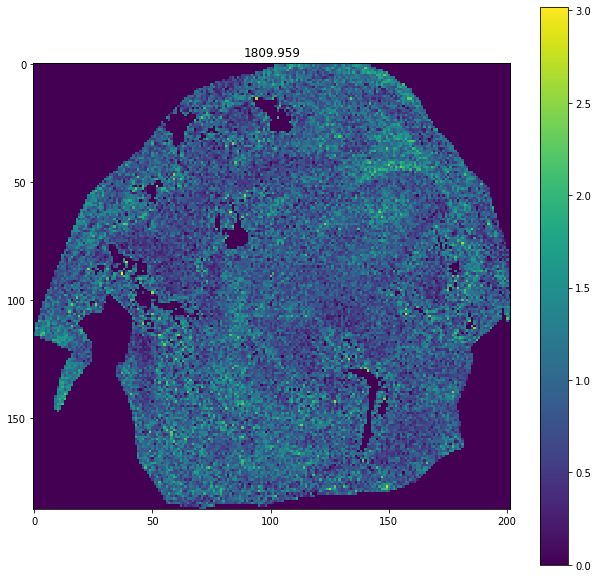

2022-08-30 23:58:22,392  SpectraRegion  INFO: Processing Mass 2027.0350547052512 with best existing mass 2027.0350547052512


[('TLN1', 2027.0443)]


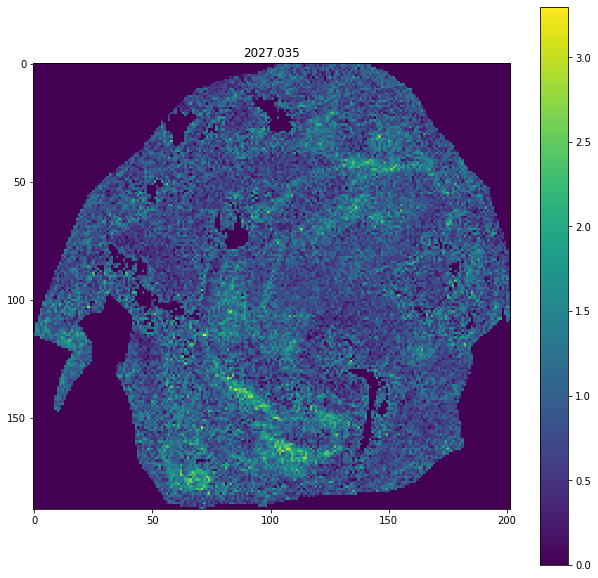

2022-08-30 23:58:22,558  SpectraRegion  INFO: Processing Mass 1878.0501121091634 with best existing mass 1878.0501121091634


[('PLOD1', 1878.0451)]


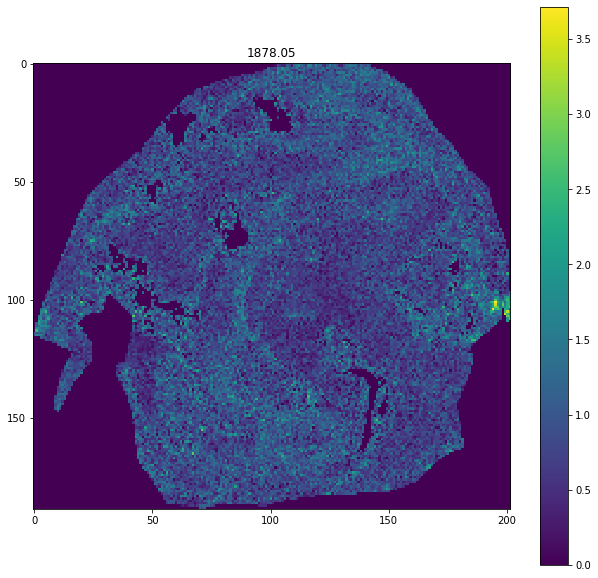

2022-08-30 23:58:22,763  SpectraRegion  INFO: Processing Mass 1908.1156283652776 with best existing mass 1908.1156283652776


[('A2MG', 1908.0979)]


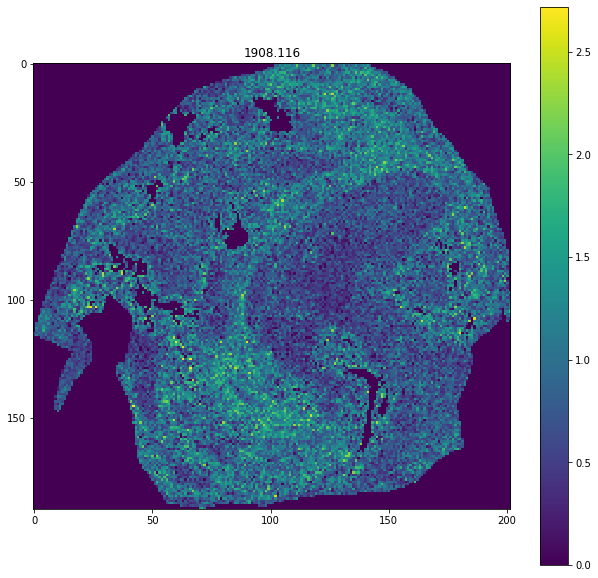

2022-08-30 23:58:22,921  SpectraRegion  INFO: Processing Mass 1806.9382132131223 with best existing mass 1806.9382132131223


[('S10A9', 1806.9312), ('APOL1', 1806.9272)]


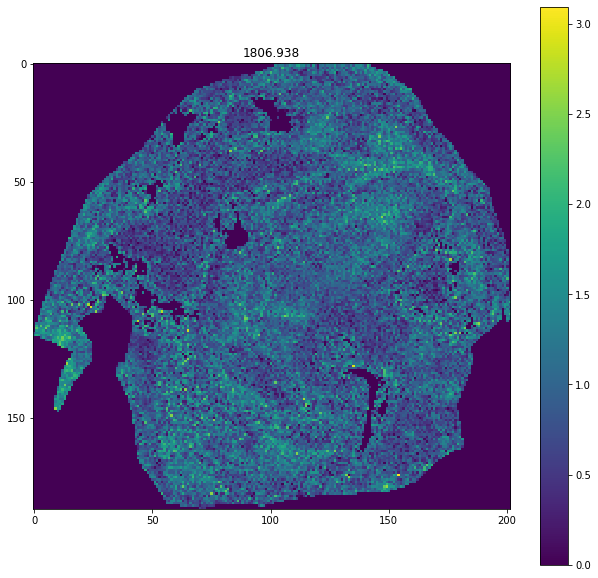

2022-08-30 23:58:23,080  SpectraRegion  INFO: Processing Mass 2048.9488360912865 with best existing mass 2048.9488360912865


[('SPB6', 2048.9449), ('MYH9', 2048.9554)]


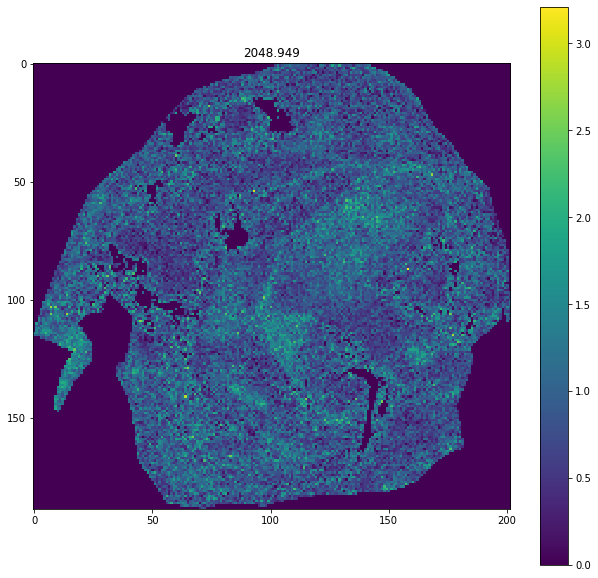

2022-08-30 23:58:23,253  SpectraRegion  INFO: Processing Mass 1901.0667752717386 with best existing mass 1901.0667752717386


[('APOH', 1901.0645)]


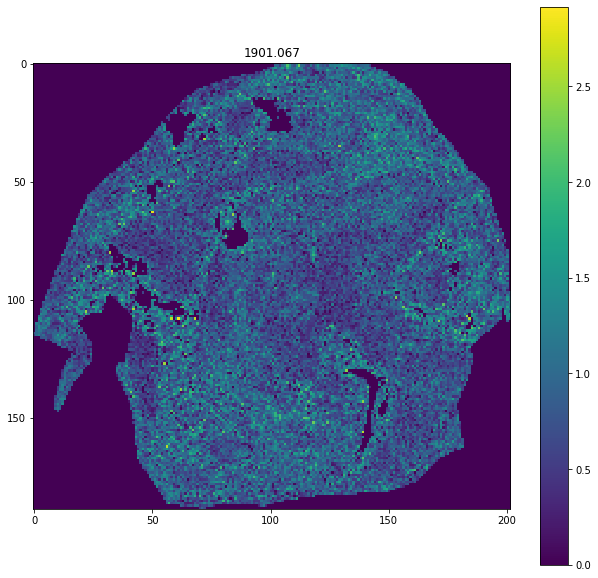

2022-08-30 23:58:23,411  SpectraRegion  INFO: Processing Mass 1879.9202159911224 with best existing mass 1879.9202159911224


[('AXA2L', 1879.9186), ('FGL2', 1879.9146), ('PDIA1', 1879.9112)]


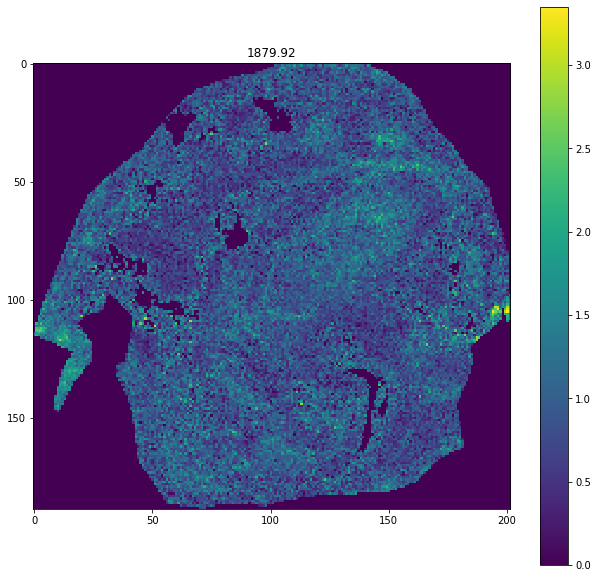

In [124]:
#for intmass in pcaDF.sort_values("PC1", ascending=False).head(100).index:
printed = 0
for intmass in pcaDF.nlargest(1000,columns=pcaDF.columns).index:

    annotation = pwfile.get_protein_from_mz(intmass)

    if len(annotation) == 0:
        continue

    printed += 1
    print(annotation)
    _ = specArray["region_1"].mass_heatmap(intmass)

    if printed > 20:
        break

2022-08-30 23:59:26,844  SpectraRegion  INFO: Processing Mass 1879.9202159911224 with best existing mass 1879.9202159911224


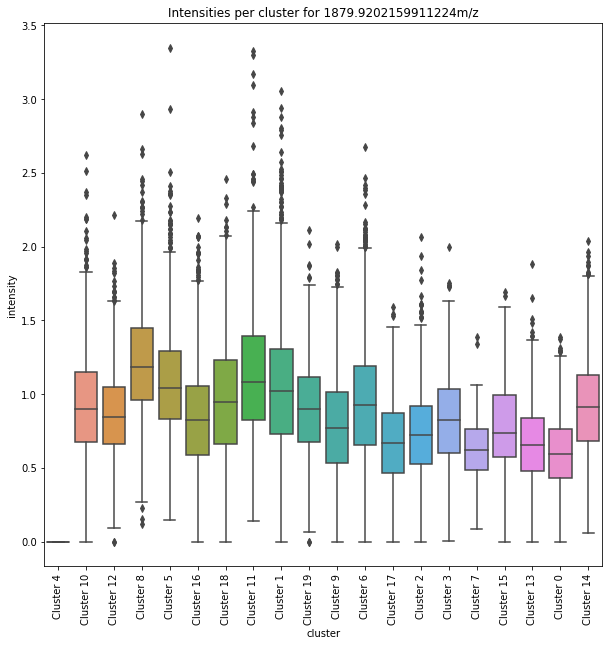

/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:1296: UserWarning: 88.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:1296: UserWarning: 93.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:1296: UserWarning: 90.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:1296: UserWarning: 84.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


KeyboardInterrupt: 

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


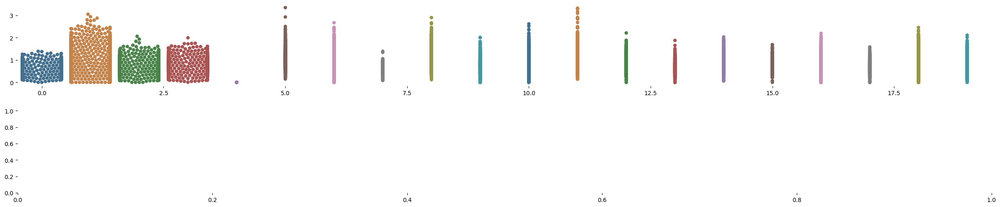

In [125]:
specArray["region_1"].mass_dabest(intmass)